In [1]:
import glob
import os
import numpy as np
import pandas as pd
import scipy.signal
import skimage
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

ip =  1

plt.style.use('styleNB.mplstyle')
f_dir = '../../data/'

In [2]:
filelist = glob.glob('../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/*.csv')
print(filelist)

['../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Keithley_slideB_prep1_1_MMStack_Pos11_tracking.csv', '../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Keithley_slideB_prep2_1_MMStack_Pos8_tracking.csv', '../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Oslo_Precision_slideA_prep2_1_MMStack_Pos16_tracking.csv', '../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Oslo_Precision_slideA_prep2_1_MMStack_Pos3_tracking.csv', '../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Keithley_slideB_prep2_1_MMStack_Pos10_tracking.csv', '../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Keithley_slideB_prep1_1_MMStack_Pos10_tracking.csv', '../../data/processed_tracking/20250411_keratocytes_KOfish_tracking/20250411_p63-LifeAct_Keithley_slideB_prep2_1_MMStack_Pos9_tracking.cs

In [3]:
df = pd.DataFrame()

for file in filelist:

    df_temp = pd.read_csv(file, skiprows=[0,2,3,4])
    df_temp = df_temp[['Track ID', 'Frame', 'X', 'Y', 'Z']]
    df_temp.columns = ['cell', 'frame', 'x', 'y', 'z']

    if 'Keithley_slideB_prep1_1_' in file: # is actually slide A
        df_temp['celltype'] = 'zebrafish_slideA'
        df_temp['trial'] = 0

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250411'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Rio'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250420'
        df_temp['user'] = 'AP'
        df_temp['filename'] = file


    if 'Keithley_slideB_prep2_1_' in file:
        df_temp['celltype'] = 'zebrafish_slideB'
        df_temp['trial'] = 1

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250411'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Rio'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250420'
        df_temp['user'] = 'AP'
        df_temp['filename'] = file

    if 'Oslo_Precision_slideB_prep1_1_' in file:
        df_temp['celltype'] = 'zebrafish_slideB'
        df_temp['trial'] = 0

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250411'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Oslo'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250420'
        df_temp['user'] = 'NB'
        df_temp['filename'] = file

    if 'Oslo_Precision_slideA_prep2_1_' in file:
        df_temp['celltype'] = 'zebrafish_slideA'
        df_temp['trial'] = 1

        df_temp['position'] = int(file.split('Pos')[1].split('_')[0])
        df_temp['date'] = '20250411'
        
        df_temp['acqtime'] = '60sec'
        df_temp['material'] = 'Ibidi_treat'
        df_temp['concentration'] = ' '
        df_temp['scope'] = 'Oslo'
        df_temp['magnification'] = '20xAir'    
        df_temp['media'] = ' '
        df_temp['analysis_date'] = '20250420'
        df_temp['user'] = 'NB'
        df_temp['filename'] = file
        
        
    df = pd.concat([df, df_temp], ignore_index = True)




In [4]:
df.head()

,cell,frame,x,y,z,celltype,trial,position,date,acqtime,material,concentration,scope,magnification,media,analysis_date,user,filename
0,0,129,383.771045,125.893790,0.0,zebrafish_slideA,0,11,20250411,60sec,Ibidi_treat,,Rio,20xAir,,20250420,AP,../../data/processed_tracking/20250411_keratoc...
1,0,80,384.577306,125.049605,0.0,zebrafish_slideA,0,11,20250411,60sec,Ibidi_treat,,Rio,20xAir,,20250420,AP,../../data/processed_tracking/20250411_keratoc...
2,0,99,384.430311,125.344830,0.0,zebrafish_slideA,0,11,20250411,60sec,Ibidi_treat,,Rio,20xAir,,20250420,AP,../../data/processed_tracking/20250411_keratoc...
3,0,68,383.885844,124.977734,0.0,zebrafish_slideA,0,11,20250411,60sec,Ibidi_treat,,Rio,20xAir,,20250420,AP,../../data/processed_tracking/20250411_keratoc...
4,0,133,384.583277,125.517875,0.0,zebrafish_slideA,0,11,20250411,60sec,Ibidi_treat,,Rio,20xAir,,20250420,AP,../../data/processed_tracking/20250411_keratoc...


In [5]:
df_0 = df[df.frame<30]
df_0['E_V_cm'] = 0

df_100 = df[df.frame<60]
df_100 = df_100[df_100.frame>=30]
df_100.frame = df_100.frame - df_100.frame.min()
df_100['E_V_cm'] = 1

df_300 = df[df.frame<110]
df_300 = df_300[df_300.frame>=80]
df_300.frame = df_300.frame - df_300.frame.min()
df_300['E_V_cm'] = 3

df_500 = df[df.frame<=df.frame.max()]
df_500 = df_500[df_500.frame>=130]
df_500.frame = df_500.frame - df_500.frame.min()
df_500['E_V_cm'] = 5

df = pd.concat([df_0, df_100, df_300, df_500], ignore_index=True)


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_43155/2577295440.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_0['E_V_cm'] = 0


In [6]:
df_groups = df.groupby(['celltype', 'E_V_cm', 'trial', 'date', 'position','user'])
for i, data in df_groups:
    print(i)

('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(0), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(1), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(2), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(3), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(4), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(5), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(6), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(7), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(8), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(9), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(10), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(0), '20250411', np.int64(11), 'AP')
('zebrafish_slideA', np.int64(0), np.int64(1), '20250411', np.

In [7]:
df = df[['cell', 'frame', 'x', 'y', 'z', 'celltype', 'position',
      'E_V_cm', 'date', 'trial', 'user']]

In [8]:
# number of cells in data
for sg, d in df.groupby(['celltype', 'E_V_cm', 'date', 'trial', 'position']):
    print(sg)
    print(len(d.frame.unique()))
    
    count = 0
    for g, d_ in d.groupby(['cell']):
        count += 1
    print(count)

('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(0))
30
47
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(1))
30
59
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(2))
30
36
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(3))
30
25
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(4))
30
24
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(5))
30
46
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(6))
30
19
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(7))
30
18
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(8))
30
18
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(9))
30
25
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(10))
30
20
('zebrafish_slideA', np.int64(0), '20250411', np.int64(0), np.int64(11))
30
17
('zebrafish_slideA', np.int64(0), '20250411', np.int64(1), np.

In [9]:
df = df.sort_values(['trial', 'user','celltype', 'position', 'cell','frame'])

df.head()

,cell,frame,x,y,z,celltype,position,E_V_cm,date,trial,user
38280,0,0,525.063654,562.884841,0.0,zebrafish_slideA,0,1,20250411,0,AP
12091,0,1,455.379555,598.606798,0.0,zebrafish_slideA,0,0,20250411,0,AP
12077,0,2,458.711268,575.802442,0.0,zebrafish_slideA,0,0,20250411,0,AP
12094,0,3,458.215489,569.180023,0.0,zebrafish_slideA,0,0,20250411,0,AP
12098,0,4,457.818427,567.066987,0.0,zebrafish_slideA,0,0,20250411,0,AP


In [10]:
np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 0])

np.False_

## Track filtering

## Oslo - zebrafish_slideB (prep 1)

(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(0), np.int64(5))


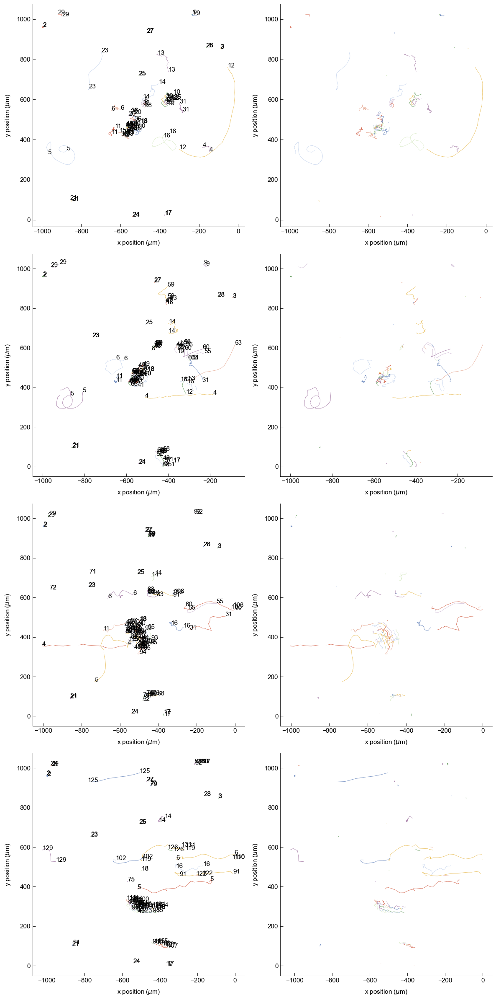

In [14]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))

                #ax[ind,0].set_ylim(0,200)
                #ax[ind,0].set_xlim(-500,-300)
    
    

            
    plt.tight_layout()


# 0 V/cm : 5, 23, 12, 16, 14, 13, 31, 11
# 1 V/cm : 52, 5, 53, 31, 16, 14, 59, 6, 11
# 3 V/cm : 5, 6, 31, 20, 14, 11, 52, 16
# 5 V/cm : 102, 119, 16, 91, 6, 5, 107




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(1), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(1), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(1), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(1), np.int64(5))


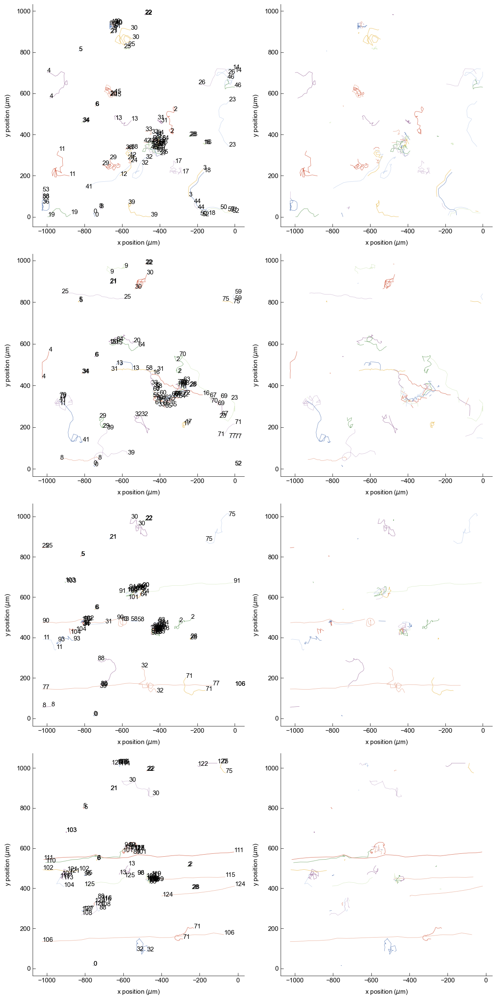

In [16]:

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))

                #ax[ind,0].set_ylim(0,200)
                #ax[ind,0].set_xlim(-500,-300)
    
    

            
    plt.tight_layout()


# 0 V/cm : 4, 30, 45, 13, 2, 26, 46, 14, 17, 18, 52, 39, 19, 11, 36, 41, 31
# 1 V/cm : 71, 39, 32, 41, 11, 13, 64, 9, 30, 2,  70
# 3 V/cm : 88, 32, 71, 30, 75
# 5 V/cm : 108, 32, 71, 122, 30




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(2), np.int64(5))


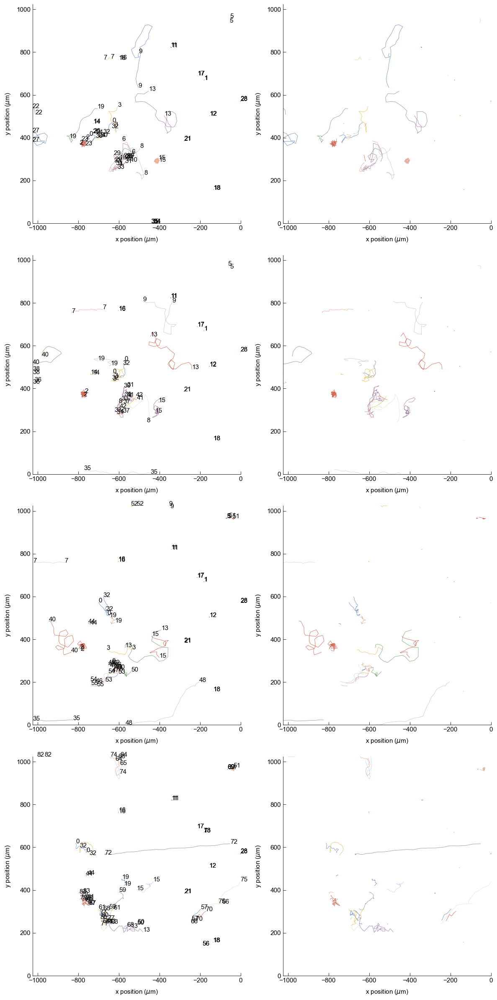

In [17]:

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()


# 0 V/cm : 27, 19, 9, 8, 0, 3, 13
# 1 V/cm : 40, 9, 13, 19, 0, 32, 15, 8, 31
# 3 V/cm : 40, 48, 3, 13, 15, 32, 54, 32, 19, 0
# 5 V/cm : 75, 0, 32, 74, 59, 15, 19, 13, 68, 



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(3), np.int64(5))


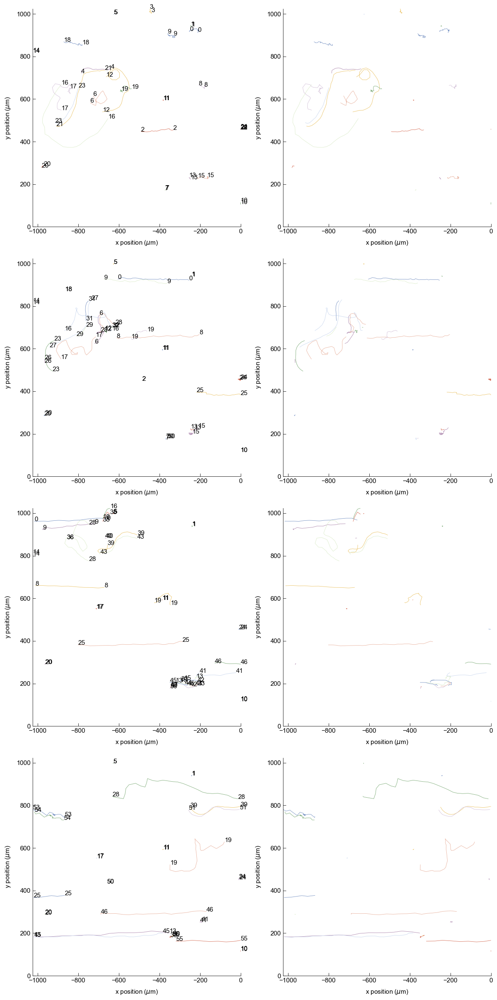

In [18]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 17, 12, 6, 21
# 1 V/cm : 27, 17, 16, 6
# 3 V/cm : 28, 39, 19
# 5 V/cm : 28, 51, 19





(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(4), np.int64(5))


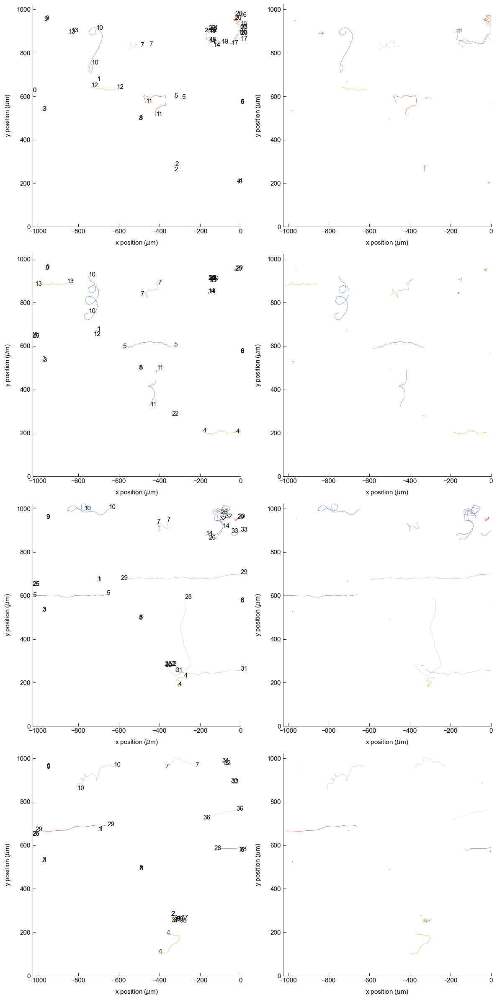

In [19]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))    

            
    plt.tight_layout()


# 0 V/cm : 10, 12, 11, 18
# 1 V/cm : 10, 7, 11, 
# 3 V/cm : 10, 7, 28, 26
# 5 V/cm : 10, 7, 28


(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(5), np.int64(5))


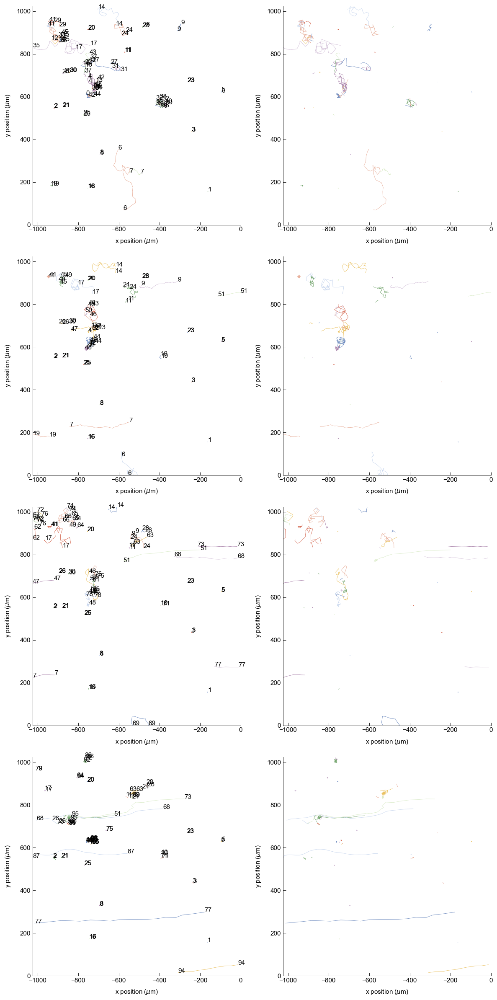

In [20]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 6, 27, 35, 14, 24, 29, 41, 17, 
# 1 V/cm : 14, 17, 49, 24, 46, 47, 44
# 3 V/cm : 69, 17, 46, 24, 49
# 5 V/cm : 87, 86



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(6), np.int64(5))


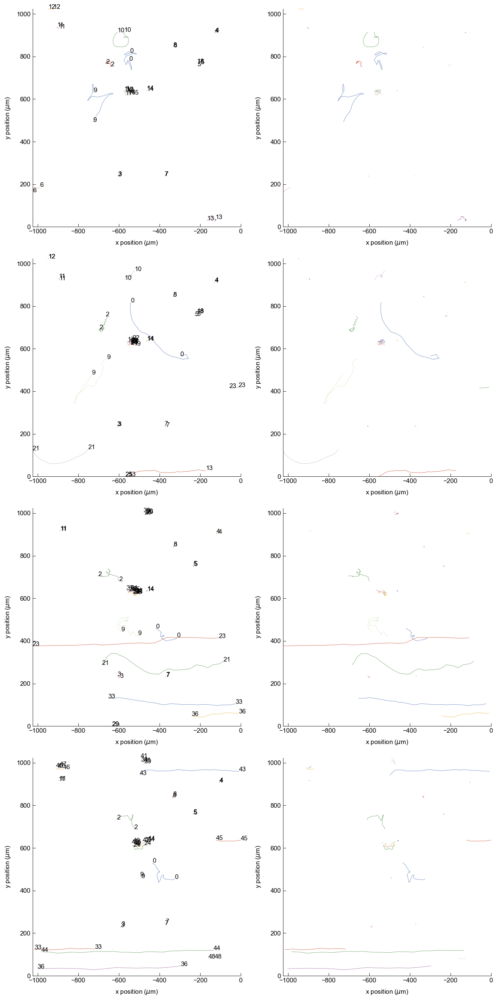

In [70]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 6]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
                #ax[ind,0].set_ylim(900,1100)
    
    

            
    plt.tight_layout()


# 0 V/cm : 2, 9, 10, 0, 15
# 1 V/cm : 21, 0, 2, 9, 19, 10
# 3 V/cm : 21, 0, 9, 2, 15, 26
# 5 V/cm :  0, 2, 24



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(7), np.int64(5))


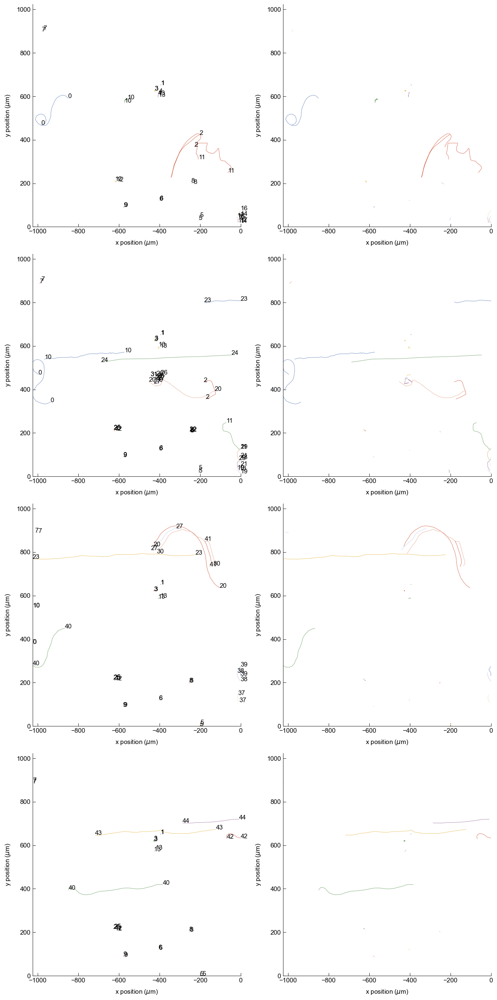

In [22]:

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 0, 2, 11
# 1 V/cm : 0, 20, 11
# 3 V/cm : 40, 20, 
# 5 V/cm :  40


(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(8), np.int64(5))


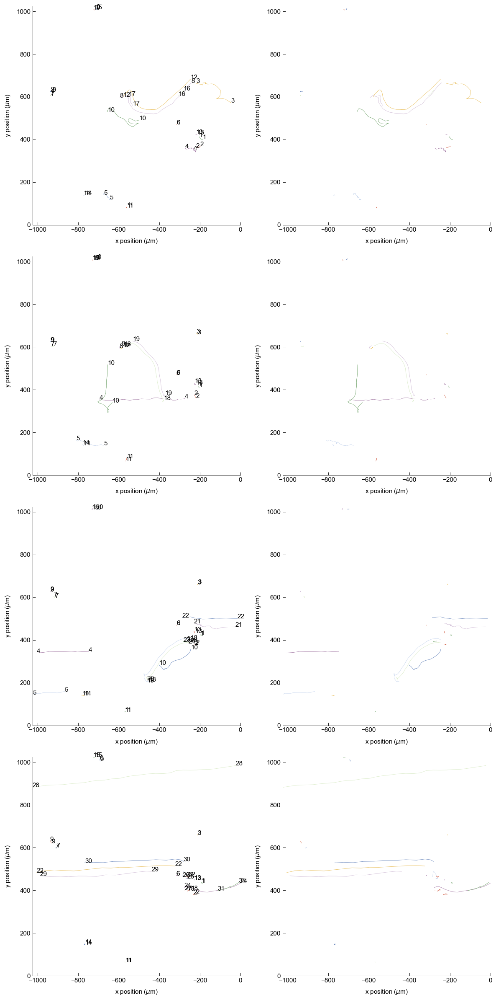

In [23]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 10, 12, 3
# 1 V/cm : 10, 19
# 3 V/cm : 18, 10
# 5 V/cm : 24, 26




(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(9), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(9), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(9), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(9), np.int64(5))


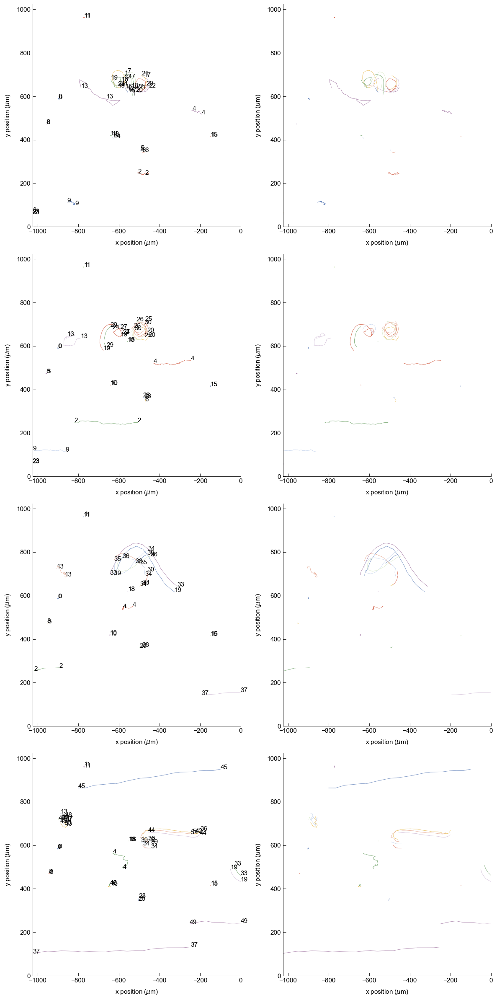

In [76]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))

                #ax[ind,0].set_ylim(650,800)
                #ax[ind,0].set_xlim(-1000,-700)
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 13, 12, 20
# 1 V/cm : 13, 25, 19
# 3 V/cm : 13, 19, 34
# 5 V/cm :  44, 18, 13



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(10), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(10), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(10), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(10), np.int64(5))


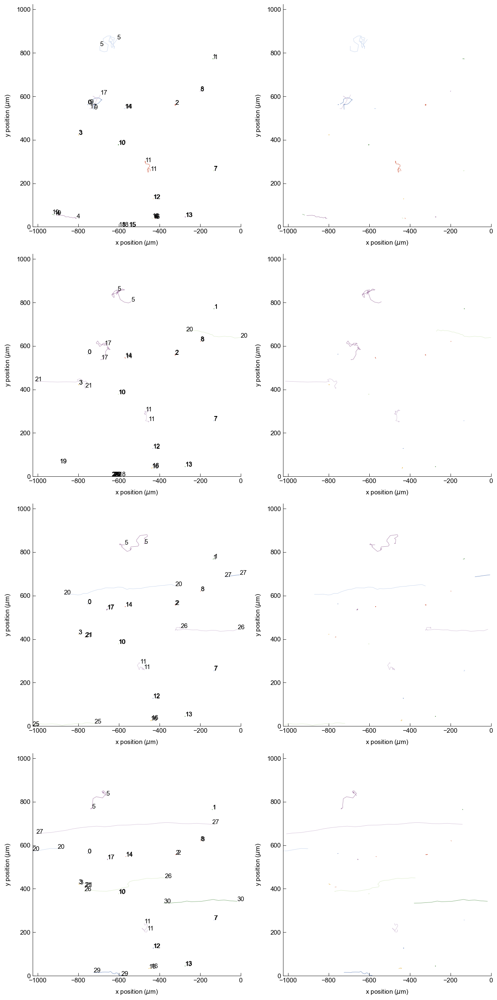

In [25]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):

    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 10]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 11, 17, 5
# 1 V/cm : 11, 17, 5
# 3 V/cm : 11, 5
# 5 V/cm :  11, 5



(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(0))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(1))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(3))
(np.int64(0), 'AP', 'zebrafish_slideA', np.int64(11), np.int64(5))


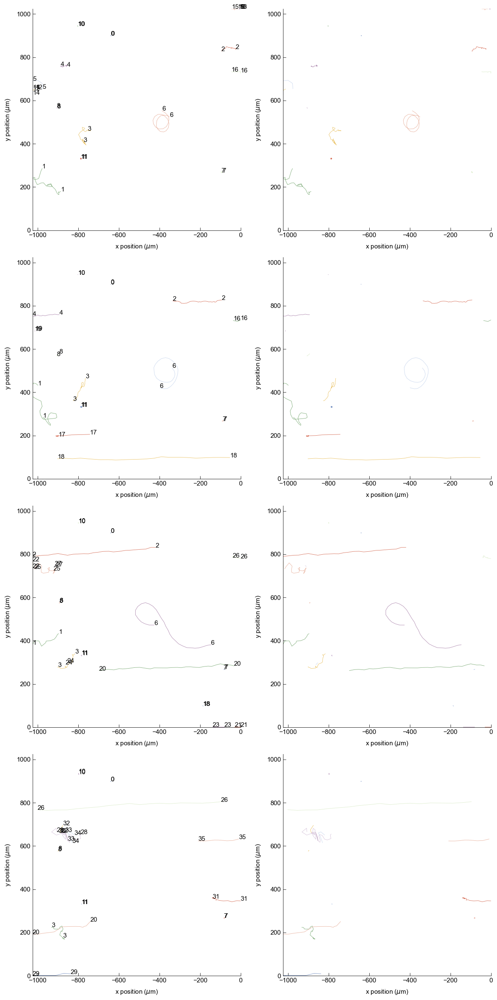

In [26]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'AP', sg[2] == 'zebrafish_slideA', sg[3] == 11]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    

            
    plt.tight_layout()


# 0 V/cm : 1, 3, 6
# 1 V/cm : 1, 3, 6 
# 3 V/cm : 1, 3, 6, 25
# 5 V/cm : 28, 3 



## Oslo - zebrafish_slideA (prep 2)

In [28]:
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if sg[1] == 'NB':
        print(sg)

(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(5))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(5))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(5))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(3))
(np.int64(

(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(0), np.int64(5))


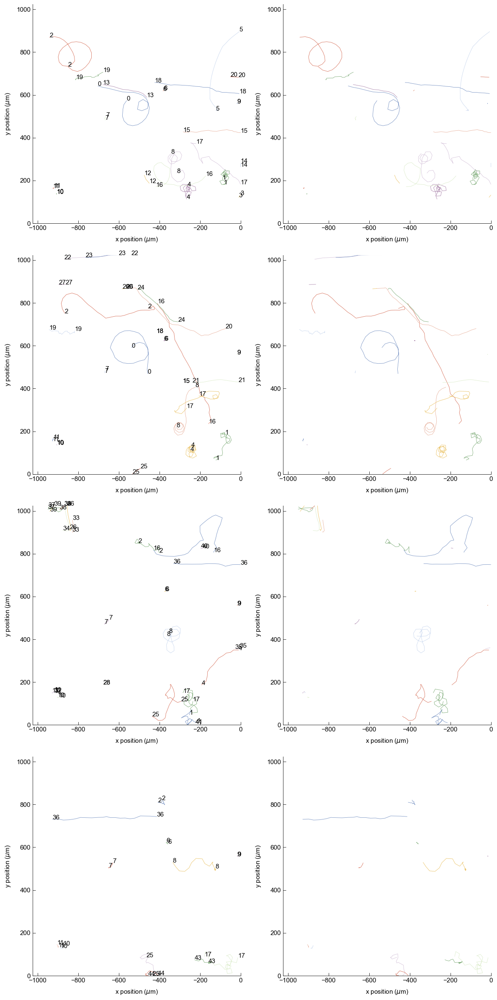

In [29]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):

    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    plt.tight_layout()


# 0 V/cm : 2, 0, 5, 12, 4, 8, 17, 1
# 1 V/cm : 0, 2, 20, 16, 17, 8, 4, 1, 
# 3 V/cm : 2, 16, 26, 8, 4, 25, 17, 1
# 5 V/cm : 2, 25, 17



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(1), np.int64(5))


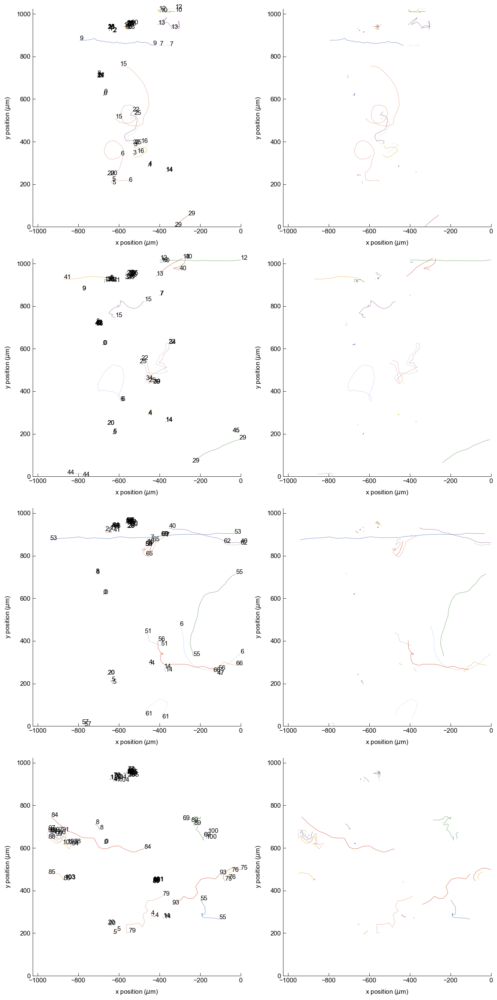

In [30]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 6, 15, 25, 3, 13
# 1 V/cm : 13, 15, 6, 25
# 3 V/cm : 56, 6, 55, 7, 40
# 5 V/cm : 79, 93, 69, 84, 85, 88



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(2), np.int64(5))


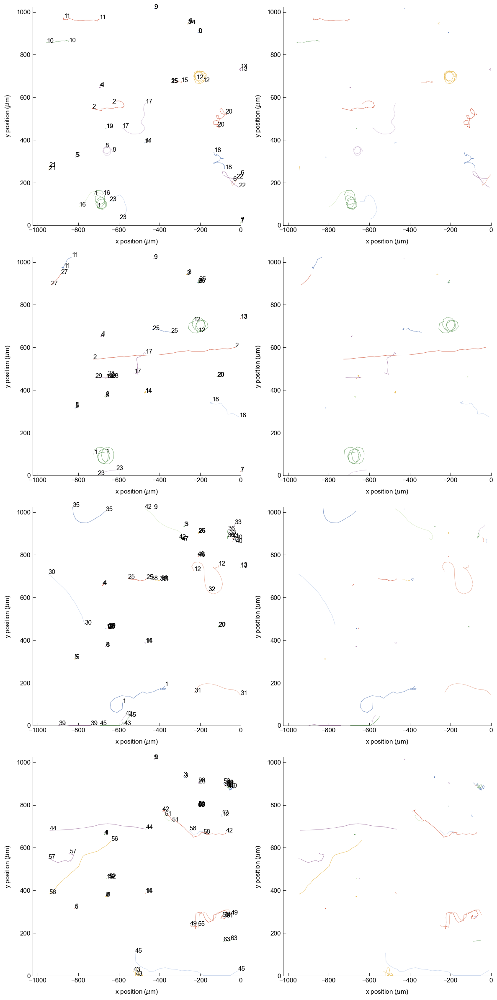

In [78]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
                
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 1, 23, 8, 17, 12, 20, 18, 22
# 1 V/cm : 12, 1
# 3 V/cm : 30, 1, 42, 35, 31, 12
# 5 V/cm : 57, 56, 49, 42, 53



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(3), np.int64(5))


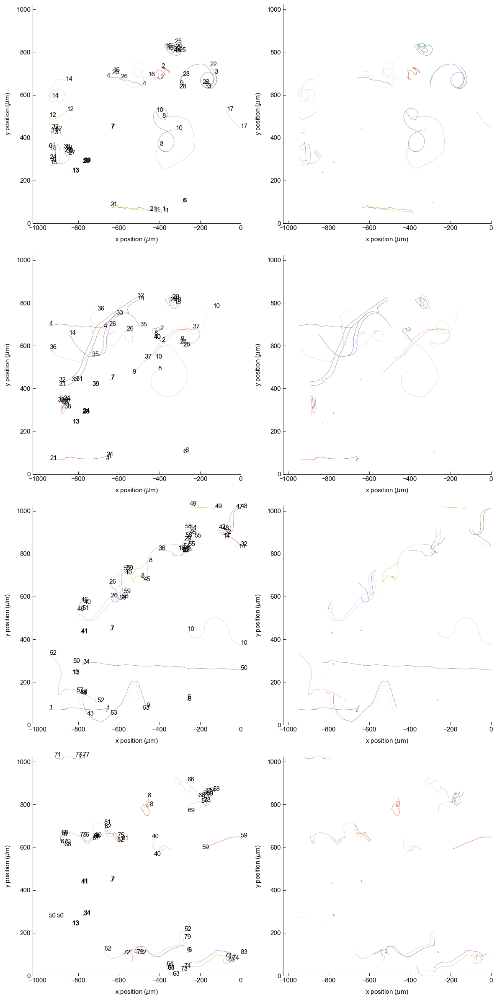

In [31]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   
    plt.tight_layout()


# 0 V/cm : 10, 8, 14, 12, 15, 24, 9, 25, 18
# 1 V/cm : 38, 8, 14, 36, 14, 32, 26, 37, 9, 18, 2
# 3 V/cm : 48, 14, 54, 8, 45, 40, 26, 10, 52, 53
# 5 V/cm : 8, 66, 69, 52, 73, 75, 40



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(5), np.int64(5))


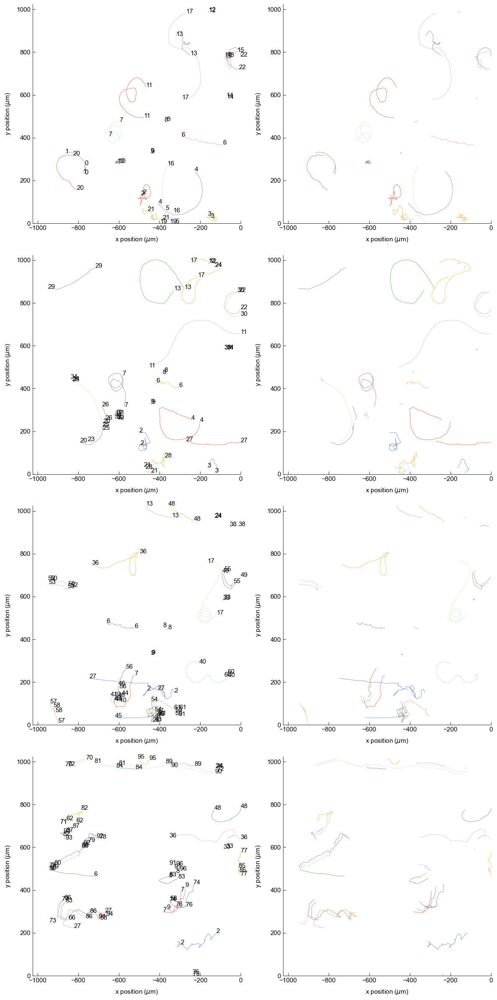

In [33]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
                
    plt.tight_layout()

# 0 V/cm : 1, 20, 17, 13, 11, 7, 15, 22, 2, 16, 4
# 1 V/cm : 29, 13, 17, 7, 11, 23, 42, 28,22
# 3 V/cm : 36, 13, 48, 17, 49, 53, 7, 40, 2, 
# 5 V/cm : 82, 28, 74, 9, 72, 48, 36, 2



array([554.57513597, 570.6084699 ])

(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(7), np.int64(5))


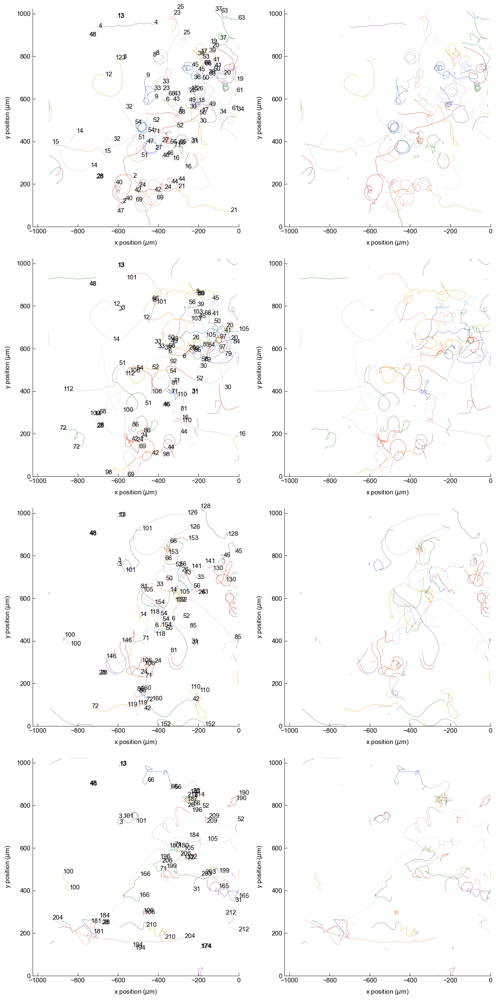

In [84]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                if len(y) >=15:
                    #print(i)
                    
                    ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                                (1024.0*ip - data_.y.values)[0]), 
                                        xytext=((data_.x.values - 1024.0*ip)[0], 
                                                (1024.0*ip - data_.y.values)[0]))
    
                    ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                                (1024.0*ip - data_.y.values)[-1]), 
                                        xytext=((data_.x.values - 1024.0*ip)[-1], 
                                                (1024.0*ip - data_.y.values)[-1]))

    
   

    

            
    plt.tight_layout()


# 0 V/cm : 2, 3, 4, 6, 8, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 61, 63, 66, 68, 69, 71
# 1 V/cm : 3, 6, 8, 12, 13, 14, 16, 20, 24, 26, 28, 30, 31, 33, 39, 41, 42, 43, 44, 45, 46, 48, 50, 51, 52, 54, 56, 66, 68, 69, 71, 72, 79, 81, 84, 85, 86, 89, 92, 97, 98, 100, 101, 103, 105, 106, 110, 112
# 3 V/cm : 3, 6, 13, 14, 24, 26, 28, 31, 33, 42, 43, 45, 48, 50, 52, 54, 56, 66, 71, 72, 81, 85, 86, 100, 101, 105, 106, 110, 118, 119, 126, 128, 130, 132, 141, 146, 152, 153, 154, 160
# 5 V/cm : 3, 13, 26, 28, 31, 48, 52, 56, 66, 71, 100, 101, 105, 106, 132, 165, 166, 174, 180, 181, 184, 187, 190, 194, 196, 199, 203, 204, 206, 209, 210, 212, 214


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(8), np.int64(5))


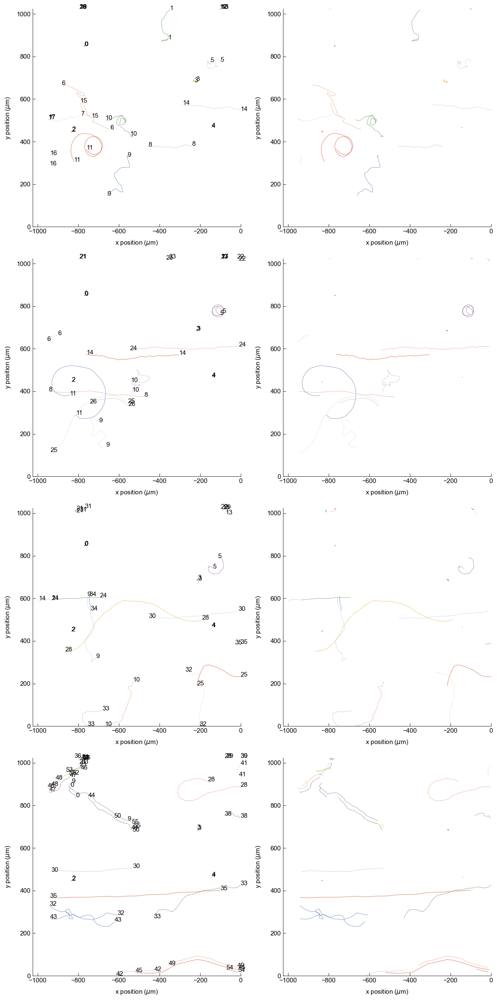

In [36]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()


# 0 V/cm : 11, 6, 10, 9, 5, 1
# 1 V/cm : 25, 9, 11, 5, 10
# 3 V/cm : 28, 9, 32, 10, 33, 5, 25
# 5 V/cm : 32, 43, 9, 33, 28, 45





(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(9), np.int64(5))


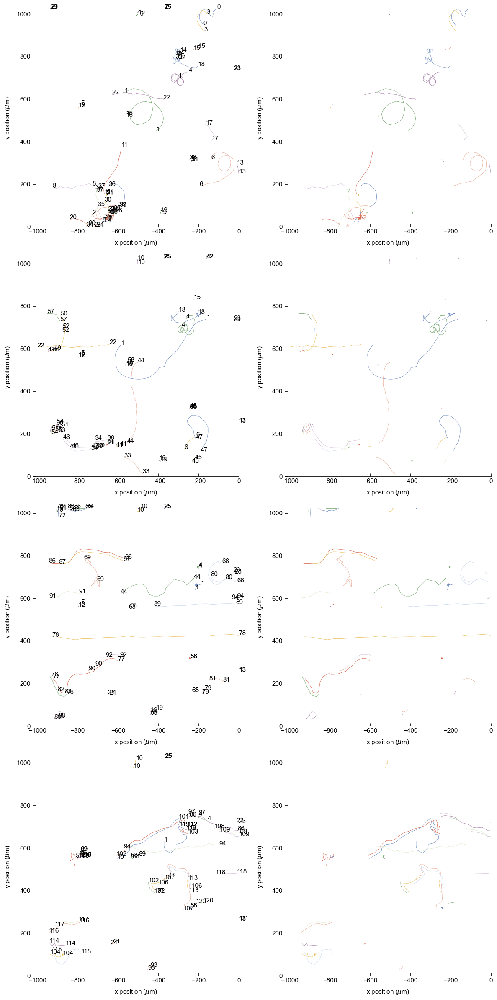

In [37]:
# I'm going to take a simple approach to identify the cells in
# np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229']):

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 1, 11, 0, 4, 18, 6, 
# 1 V/cm : 50, 1, 4, 18, 47, 44, 35
# 3 V/cm : 69, 44, 86, 77, 66, 
# 5 V/cm : 107, 86, 103, 51, 115, 117





(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(10), np.int64(5))


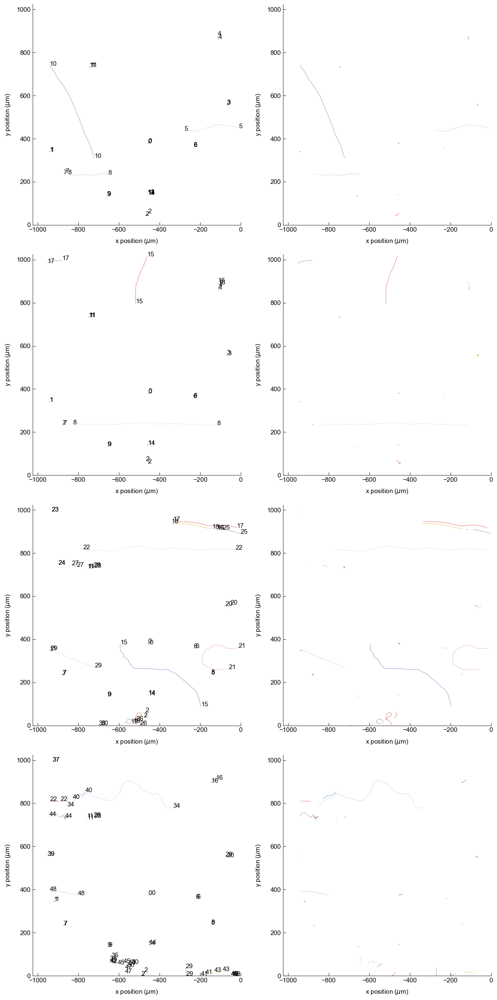

In [38]:

f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 10]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 10, 8, 5
# 1 V/cm : 15, 17
# 3 V/cm : 15, 21, 29, 17, 26
# 5 V/cm : 34


In [59]:
# f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# # ax = ax.ravel()
    
# for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
#     if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 13]):
#         print(sg)


#         if sg[4] == 0:
#             ind = 0
#         elif sg[4] == 1:
#             ind = 1
#         elif sg[4] == 3:
#             ind = 2
#         elif sg[4] == 5:
#             ind = 3
            
#         aq = 0
#         for g, d_ in d.groupby(['E_V_cm']):

#             #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
#             #print(g)
            
#             ##################################
#             # plot tracks
#             ##################################
#             num_cells = len(d_.cell.unique())
#             for i in d_.cell.unique():
#                 data_ = d_[d_.cell==i]
#                 #if len(data_.frame.unique()) == 31:

#                 # if i != 45:
#                 #     continue
    
#                 data_ = data_.replace([np.inf, -np.inf], np.nan)
#                 d_x = data_.x[~np.isnan(data_.x)] 
#                 d_y = data_.y[~np.isnan(data_.y)] 
    
#                 if len(d_x)==0:
#                     continue

#                 x = data_.x.values 
#                 y = data_.y.values 
    
#                 for ax_ in [ax[ind,0], ax[ind,1]]:
#                     ax_.plot(data_.x.values - 1024.0*ip, 
#                                    1024.0*ip - data_.y.values)
#                     ax_.set_xlabel(r'x position ($\mu$m)')
#                     ax_.set_ylabel(r'y position ($\mu$m)')
#                     ax_.set_xlim(-1024.0*ip, 0)
#                     ax_.set_ylim(0,1024.0*ip)
                
#                 ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
#                                             (1024.0*ip - data_.y.values)[0]), 
#                                     xytext=((data_.x.values - 1024.0*ip)[0], 
#                                             (1024.0*ip - data_.y.values)[0]))

#                 ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
#                                             (1024.0*ip - data_.y.values)[-1]), 
#                                     xytext=((data_.x.values - 1024.0*ip)[-1], 
#                                             (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
#     plt.tight_layout()


# # 0 V/cm : 
# # 1 V/cm : 
# # 3 V/cm : 
# # 5 V/cm : 




(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(13), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(13), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(13), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(13), np.int64(5))


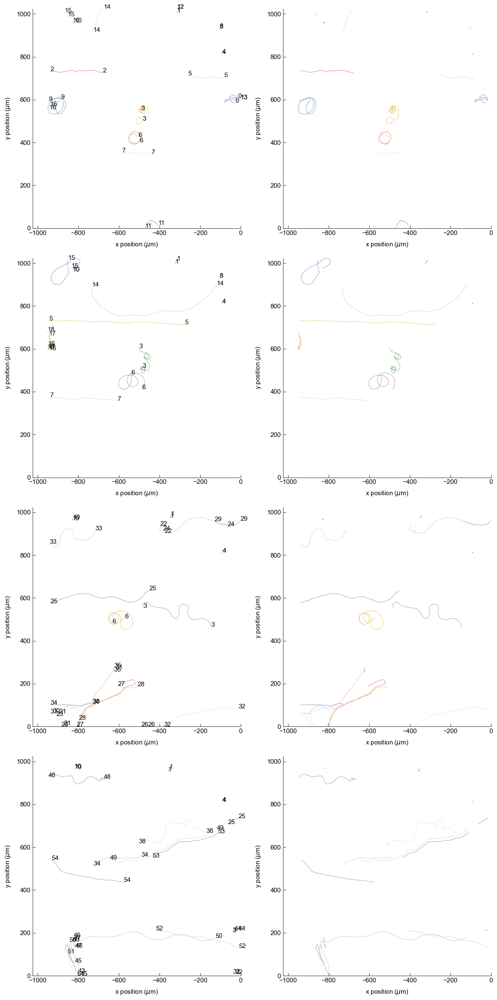

In [15]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 13]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 7, 3, 9, 0
# 1 V/cm : 14, 15, 3, 6
# 3 V/cm : 6, 33, 24, 25, 27, 21, 32, 30
# 5 V/cm : 54, 53, 38, 50, 45 





(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(14), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(14), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(14), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(14), np.int64(5))


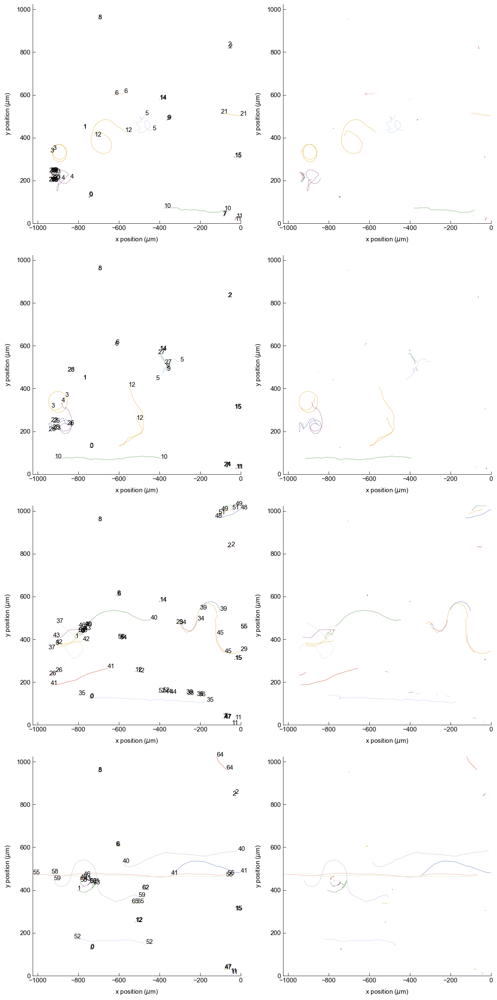

In [86]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 14]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    

            
    plt.tight_layout()


# 0 V/cm : 12, 5, 3, 4 
# 1 V/cm : 3, 12, 5, 26, 4
# 3 V/cm : 48, 40, 29, 37, 40, 41, 
# 5 V/cm : 59, 40, 41



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(15), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(15), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(15), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(15), np.int64(5))


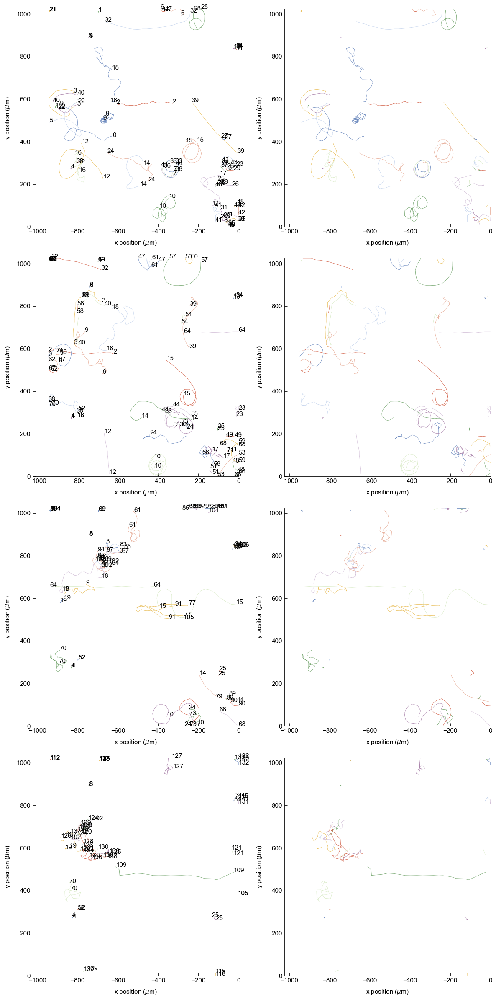

In [20]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 15]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)


                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))

    plt.tight_layout()


# 0 V/cm : 32, 28, 18, 3, 0, 12, 24, 14, 10, 56, 15, 17, 23, 39
# 1 V/cm : 3, 18, 9, 0, 62, 38, 10, 24, 14, 36, 17, 56, 39, 57, 47
# 3 V/cm : 61, 85, 70, 14, 10, 73, 15, 77, 9, 18, 82
# 5 V/cm : 126, 102, 18, 70, 109, 127


(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(16), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(16), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(16), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(16), np.int64(5))


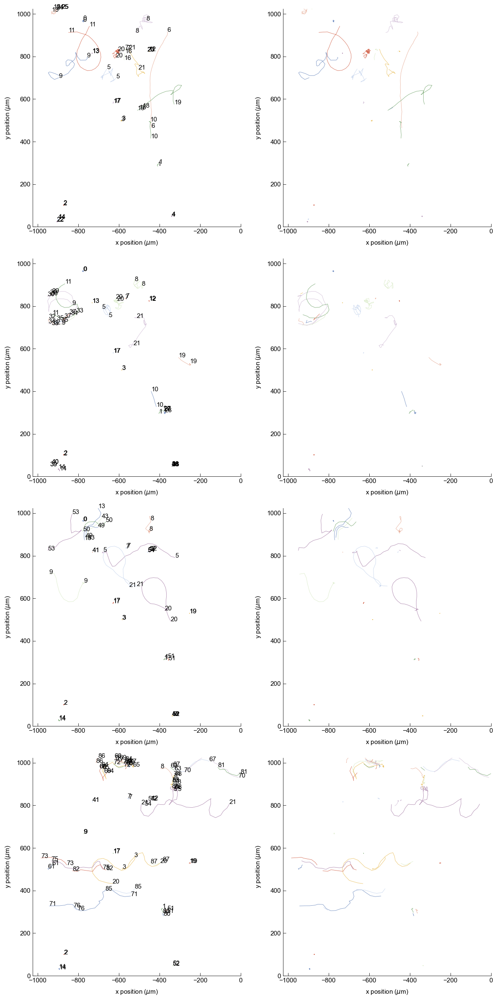

In [22]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 16]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))

       
            
    plt.tight_layout()


# 0 V/cm : 11, 9, 8, 19, 6, 21, 5, 20
# 1 V/cm : 11, 9, 21, 5, 20, 8, 
# 3 V/cm : 53, 50, 8, 5, 20, 21, 9
# 5 V/cm : 20, 71, 75, 21, 5, 70, 65



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(17), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(17), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(17), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(17), np.int64(5))


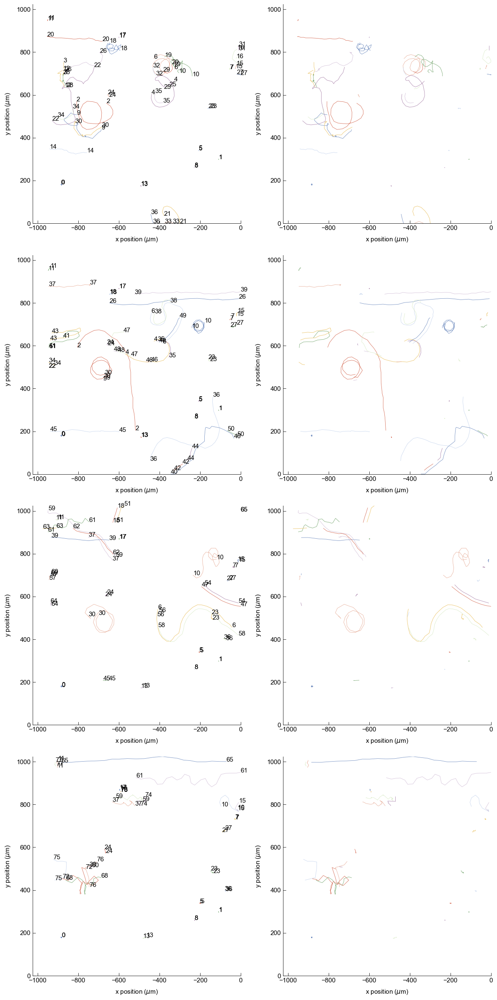

In [13]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 17]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 9, 2, 22, 26, 18, 6, 4, 10
# 1 V/cm : 43, 41, 2, 4, 6, 36, 40, 30, 10
# 3 V/cm : 30, 58, 10, 47, 61, 59, 
# 5 V/cm : 61, 59, 10, 68, 75



(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(18), np.int64(0))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(18), np.int64(1))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(18), np.int64(3))
(np.int64(1), 'NB', 'zebrafish_slideA', np.int64(18), np.int64(5))


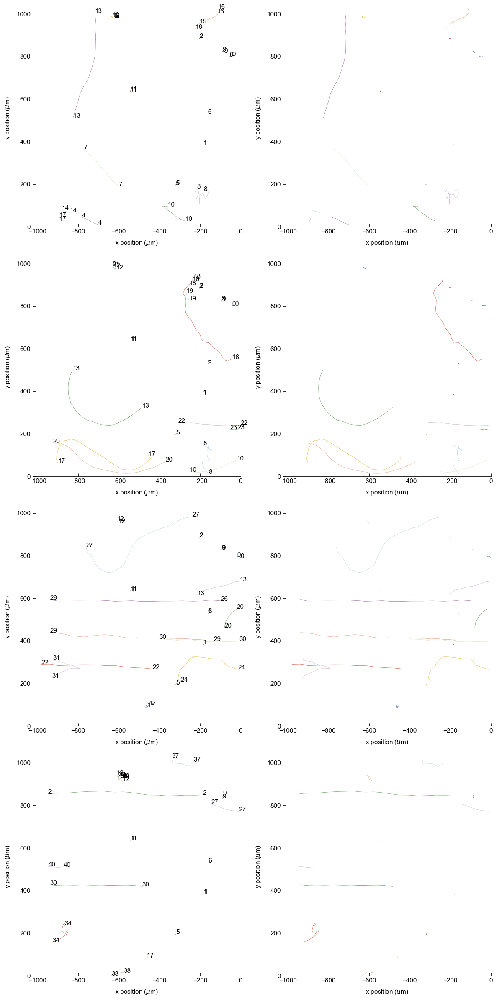

In [14]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'NB', sg[2] == 'zebrafish_slideA', sg[3] == 18]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
            
    plt.tight_layout()


# 0 V/cm : 15, 13, 7, 4, 8, 10
# 1 V/cm : 20, 17, 13, 16, 8
# 3 V/cm : 31, 27, 24, 13, 20
# 5 V/cm : 34, 27, 37




## Oslo - zebrafish_slideB (prep 1)

(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(0), np.int64(5))


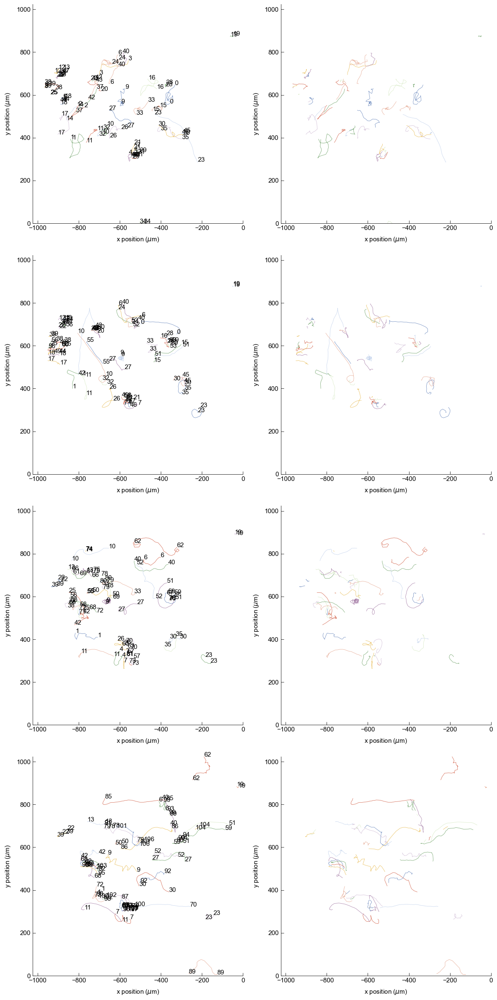

In [23]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()


# 0 V/cm : 23, 30, 35, 11, 27, 38, 20, 6, 3, 9, 37, 17, 1, 0, 15, 33
# 1 V/cm : 1, 42, 11, 26, 23, 15, 33, 16, 0, 10, 7
# 3 V/cm : 10, 62, 40, 6, 33, 27, 25, 1, 11, 23, 
# 5 V/cm : 85, 62, 59, 51, 39, 13, 79, 70, 11, 92, 30, 9, 42, 86



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(1), np.int64(5))


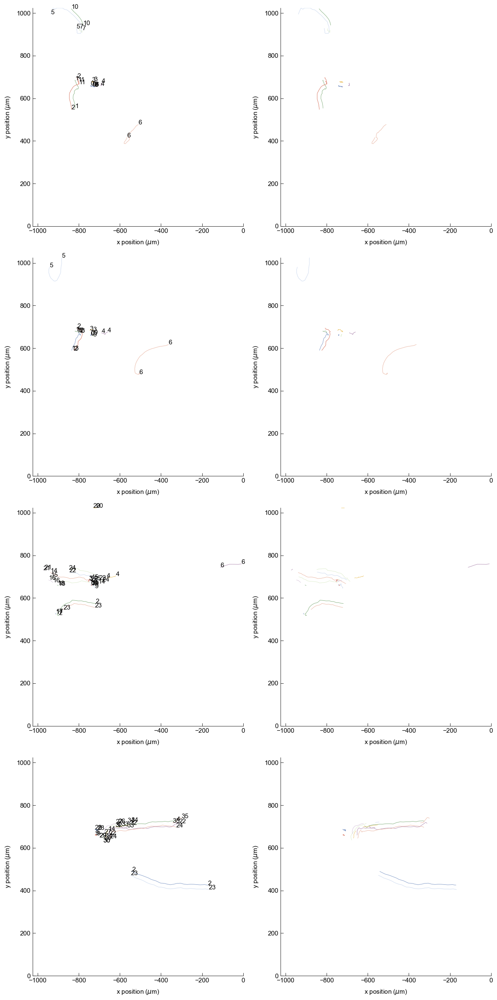

In [35]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
              
    plt.tight_layout()


# 0 V/cm : 5, 2, 6, 
# 1 V/cm : 5, 2, 6
# 3 V/cm : 2, 14, 6
# 5 V/cm : 2, 22



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(2), np.int64(5))


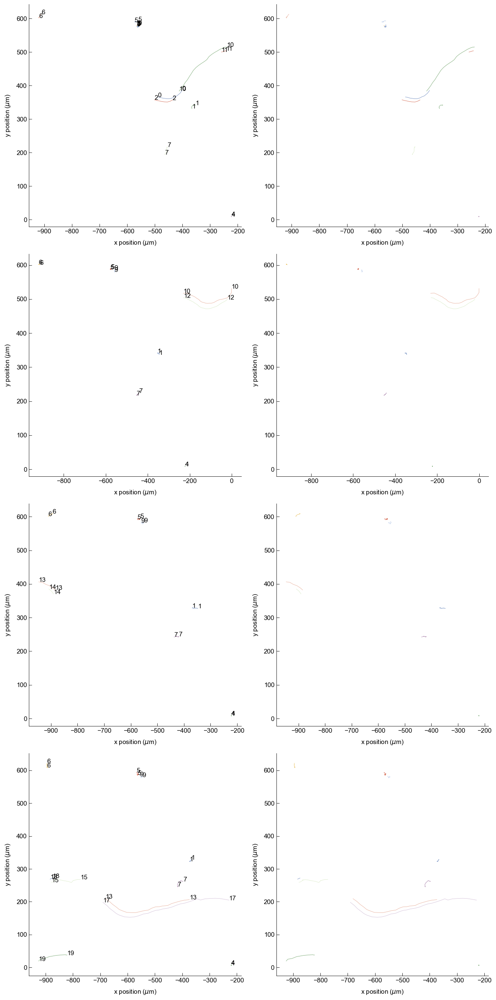

In [58]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue
    
                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
    
    plt.tight_layout()


# 0 V/cm : 2, 10
# 1 V/cm : 10
# 3 V/cm : 13
# 5 V/cm : 19, 17, 15




(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(3), np.int64(5))


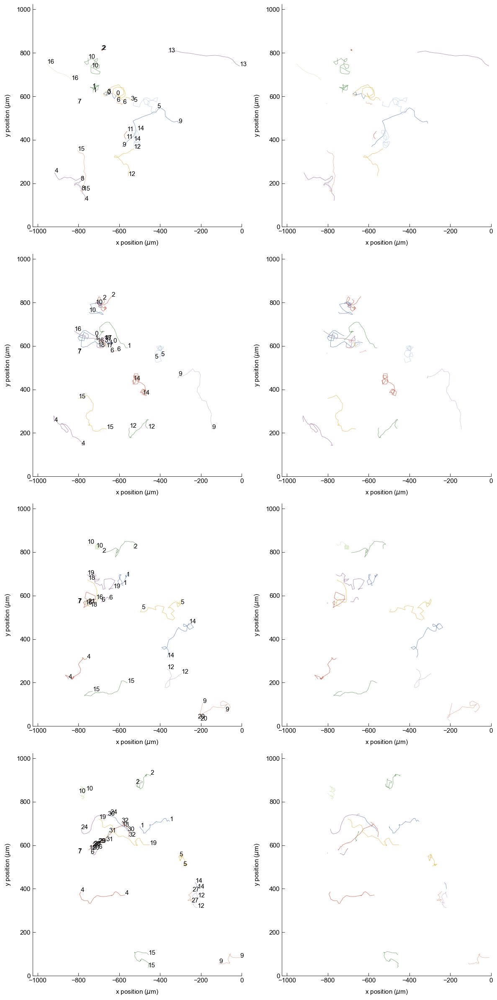

In [38]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   
            
    plt.tight_layout()

# 0 V/cm : 16, 13, 1, 0, 5, 9, 14, 12, 15, 4
# 1 V/cm : 4, 15, 12, 9, 14, 5, 2, 0, 1, 16
# 3 V/cm : 4, 15, 9, 12, 14, 5, 19, 1, 2
# 5 V/cm : 2, 4, 9, 19, 1, 24, 19, 18




(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(4), np.int64(5))


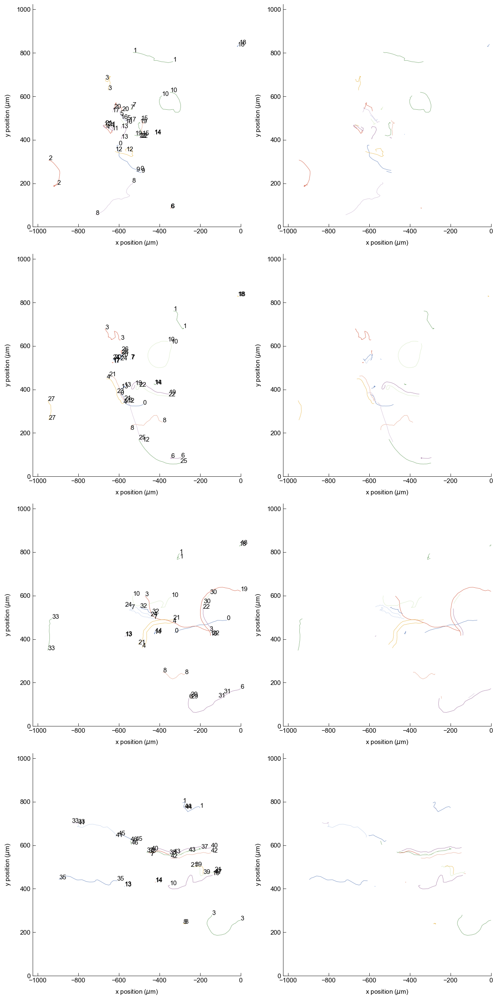

In [39]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
           
    plt.tight_layout()

# 0 V/cm : 1, 3, 2, 8, 0, 12, 10, 11, 13, 15, 
# 1 V/cm : 25, 8, 0, 22, 21, 10, 3, 1
# 3 V/cm : 6, 8, 4, 0, 19, 10, 3
# 5 V/cm : 3, 35, 10, 41, 40, 1




(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(5), np.int64(5))


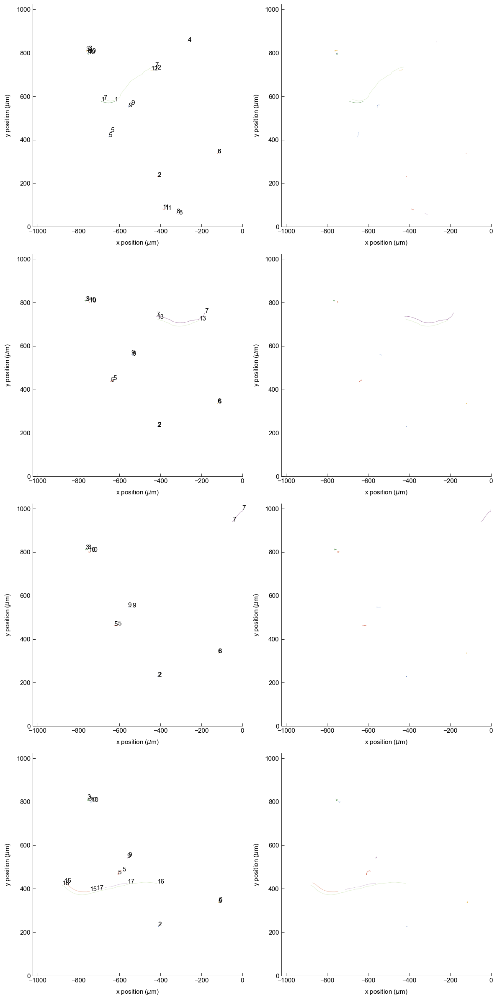

In [40]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
          
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 44:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
        
    plt.tight_layout()


# 0 V/cm : 7
# 1 V/cm : 7
# 3 V/cm : 
# 5 V/cm : 16



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(6), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(6), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(6), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(6), np.int64(5))


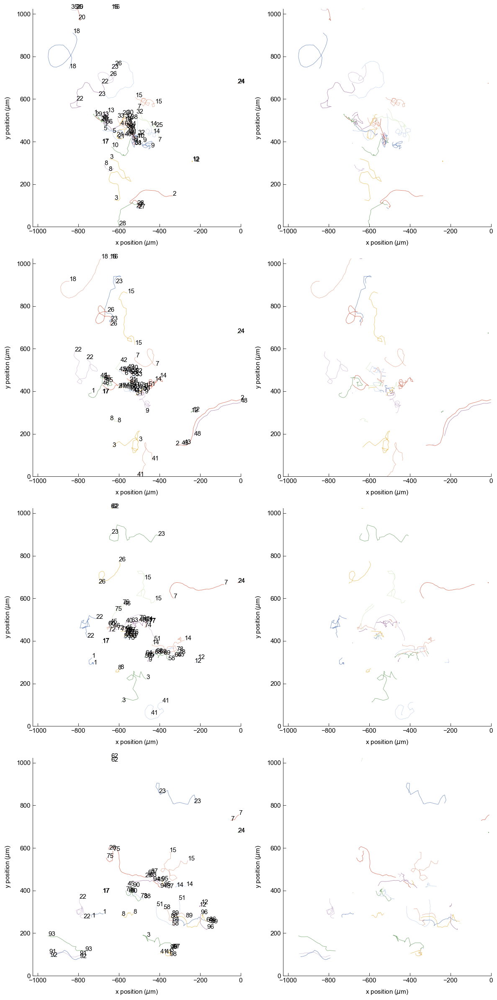

In [41]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 6]):
        print(sg)

        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()

# 0 V/cm : 18, 22, 26, 15, 22, 15, 10, 3, 2, 28, 7, 9, 10, 14
# 1 V/cm : 18, 23, 26, 15, 22, 7, 2, 3, 41, 9 , 14, 1
# 3 V/cm : 23, 26, 7, 115, 22, 51, 15, 14, 64, 58, 41, 3
# 5 V/cm : 23, 75, 15, 14, 22, 93, 91, 3, 51, 58, 86, 64, 


(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(7), np.int64(5))


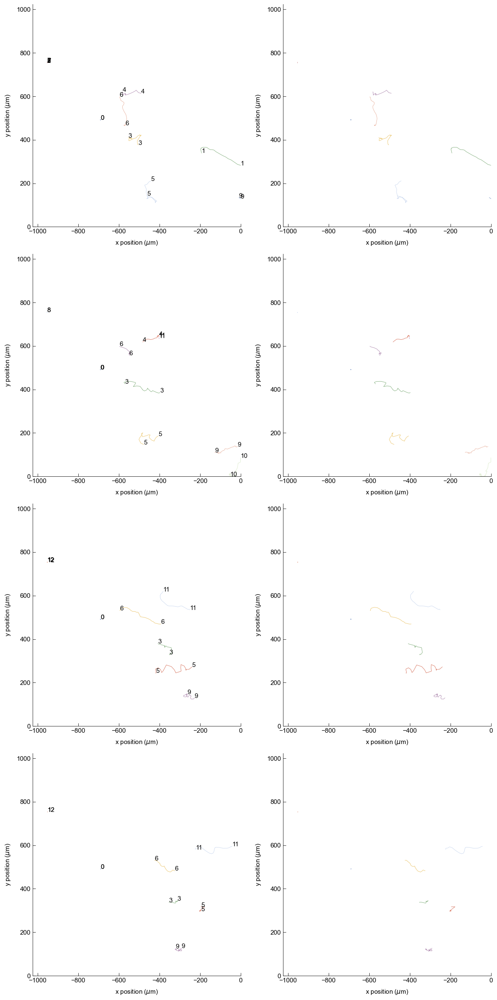

In [42]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
                
    plt.tight_layout()

# 0 V/cm : 6, 5, 1, 3, 4
# 1 V/cm : 6, 4, 3, 5
# 3 V/cm : 11, 6, 3, 5
# 5 V/cm : 11, 6, 


(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(8), np.int64(5))


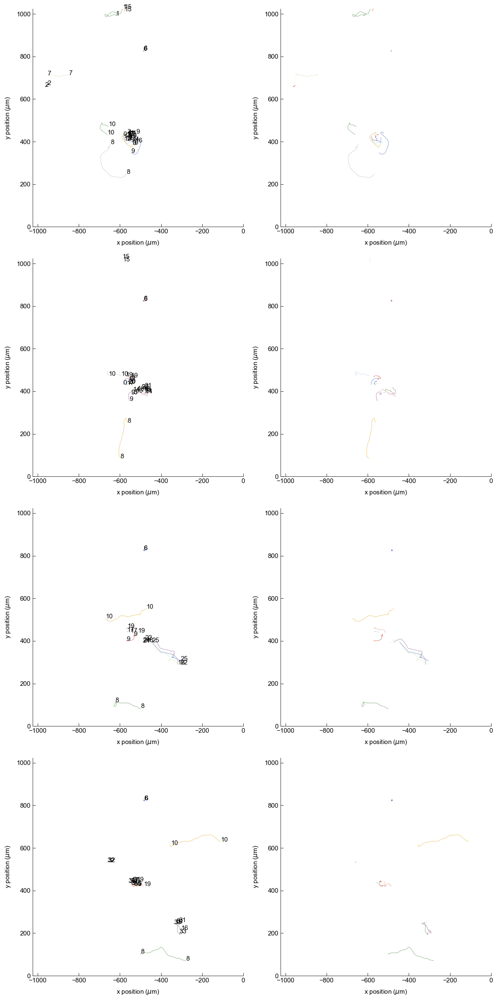

In [43]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
         ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    

            
    plt.tight_layout()


# 0 V/cm : 10, 8, 1
# 1 V/cm : 10, 8
# 3 V/cm : 10, 8, 22
# 5 V/cm : 10, 8



(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(0))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(1))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(3))
(np.int64(0), 'NB', 'zebrafish_slideB', np.int64(9), np.int64(5))


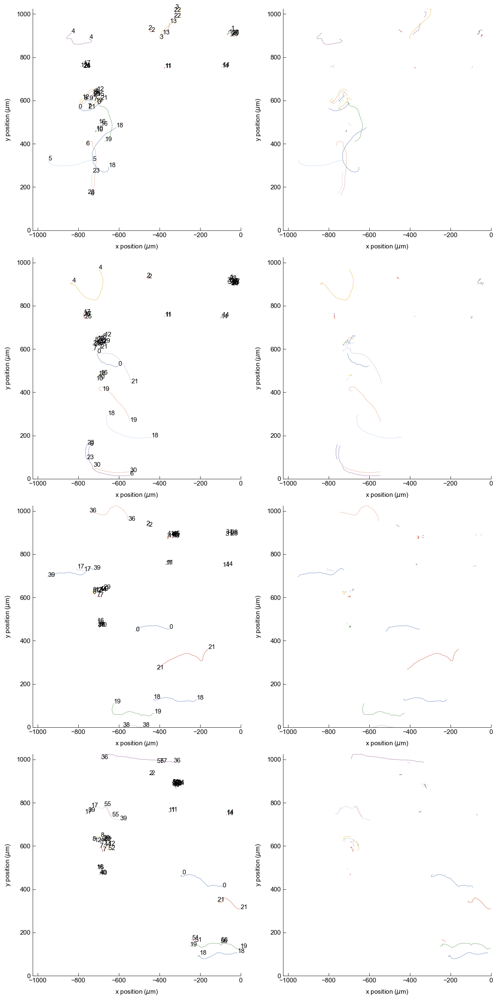

In [44]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 0, sg[1] == 'NB', sg[2] == 'zebrafish_slideB', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
            
    plt.tight_layout()

# 0 V/cm : 4, 3, 19, 5, 6, 18, , 12, 0
# 1 V/cm : 4, 0, 21, 19, 18, 6
# 3 V/cm : 36, 39, 0, 18, 19, 21
# 5 V/cm : 36, 39, 0, 21, 19, 18





## Rio - Zebrafish group B, prep 2

(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(0), np.int64(5))


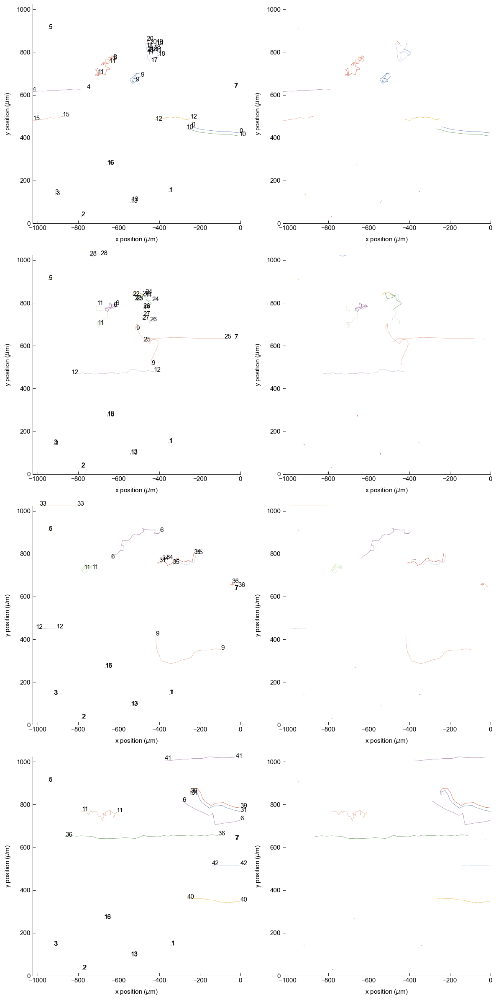

In [45]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 0]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
             
    plt.tight_layout()

# 0 V/cm : 14, 10, 9
# 1 V/cm : 9, 14
# 3 V/cm : 9, 6, 31
# 5 V/cm : 6, 31


(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(1), np.int64(5))


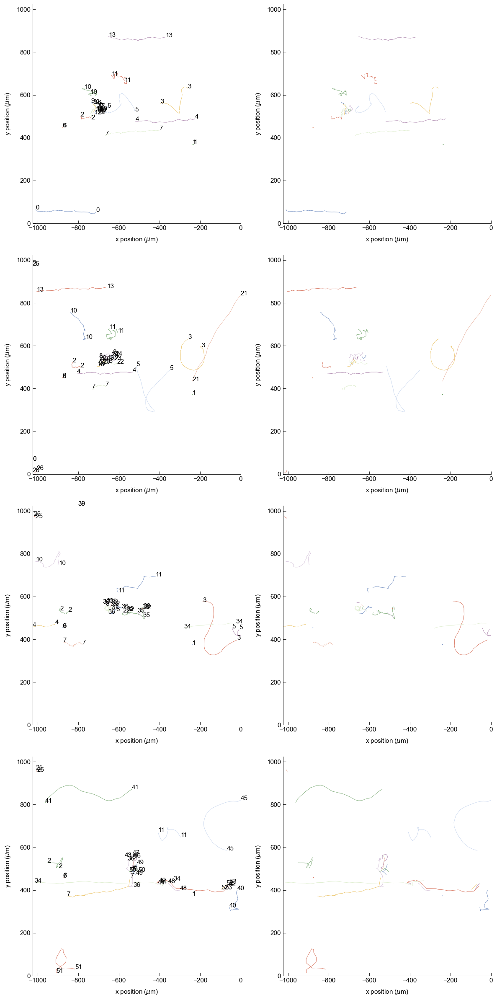

In [46]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 1]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()


# 0 V/cm : 10, 5, 4, 3
# 1 V/cm : 5, 21, 3, 11, 10
# 3 V/cm : 3, 11, 22, 10
# 5 V/cm : 41, 11, 45, 42, 51




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(2), np.int64(5))


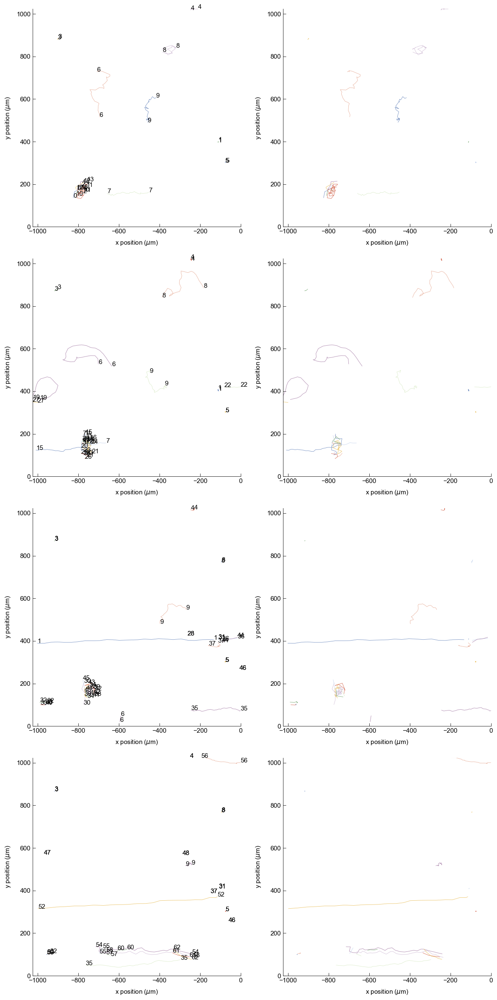

In [47]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 2]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
             
    plt.tight_layout()

# 0 V/cm : 6, 9, 8
# 1 V/cm : 8, 9, 6, 19
# 3 V/cm : 9
# 5 V/cm : 


(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(3), np.int64(5))


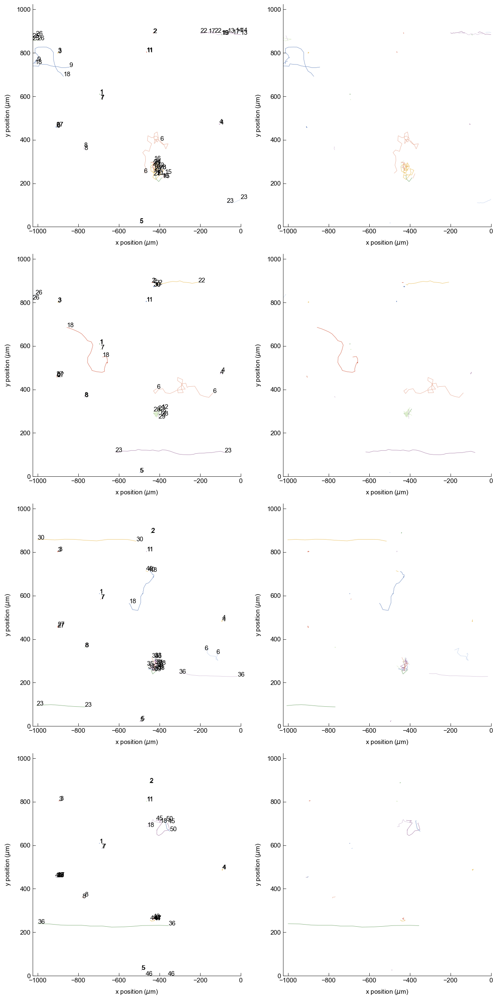

In [61]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 3]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i >= 30:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
                # ax[ind,0].set_xlim(-500, -300)
                # ax[ind,0].set_ylim(200,400)
    
            
    plt.tight_layout()

# 0 V/cm : 9, 6, 
# 1 V/cm : 18, 6, 
# 3 V/cm : 
# 5 V/cm : 




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(4), np.int64(5))


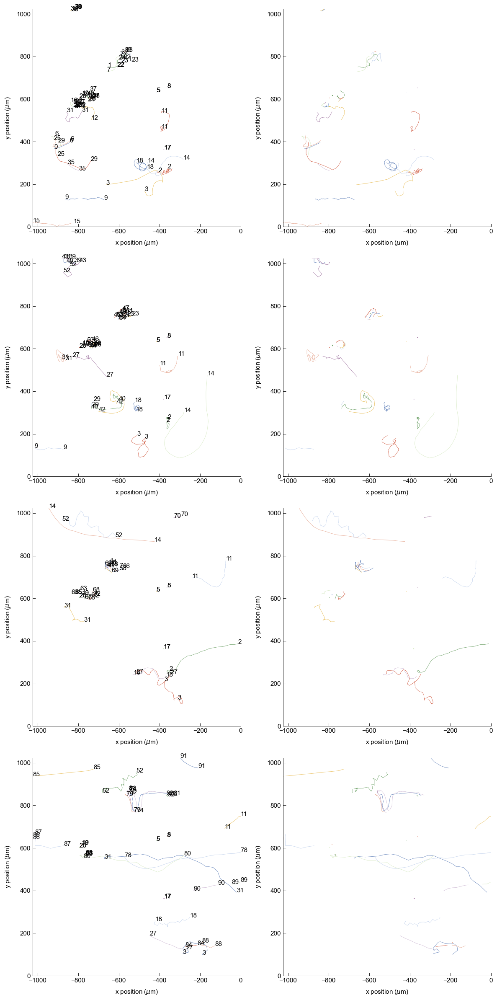

In [49]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 4]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
         
    plt.tight_layout()

# 0 V/cm : 29, 11, 31, 3, 14, 18, 2, 1
# 1 V/cm : 27, 3, 14, 11, 40, 
# 3 V/cm : 11, 14, 52, 3, 18, 2, 31
# 5 V/cm : 78, 31, 27, 3, 18, 87, 52, 21, 91




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(5), np.int64(5))


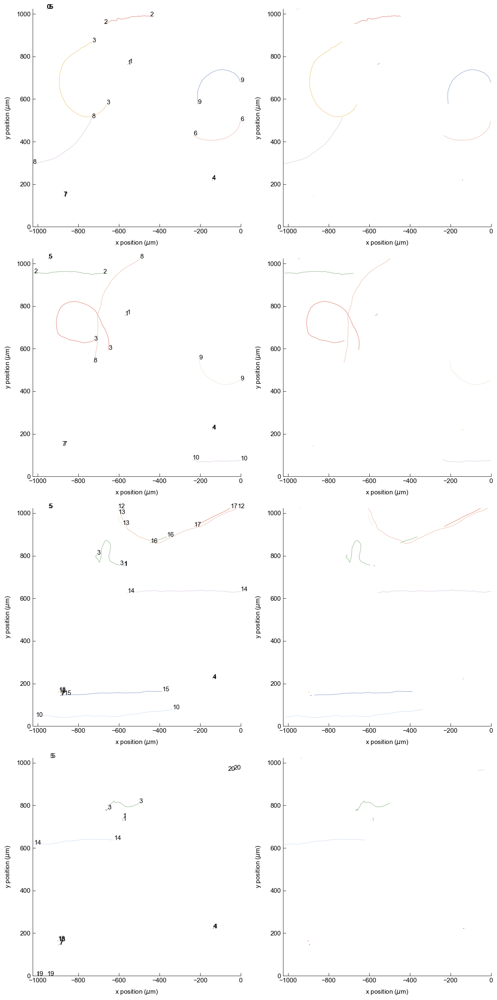

In [50]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 5]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()

# 0 V/cm : 3, 8, 6, 9
# 1 V/cm : 3, 8, 9
# 3 V/cm : 3, 12
# 5 V/cm : 3



(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(6), np.int64(5))


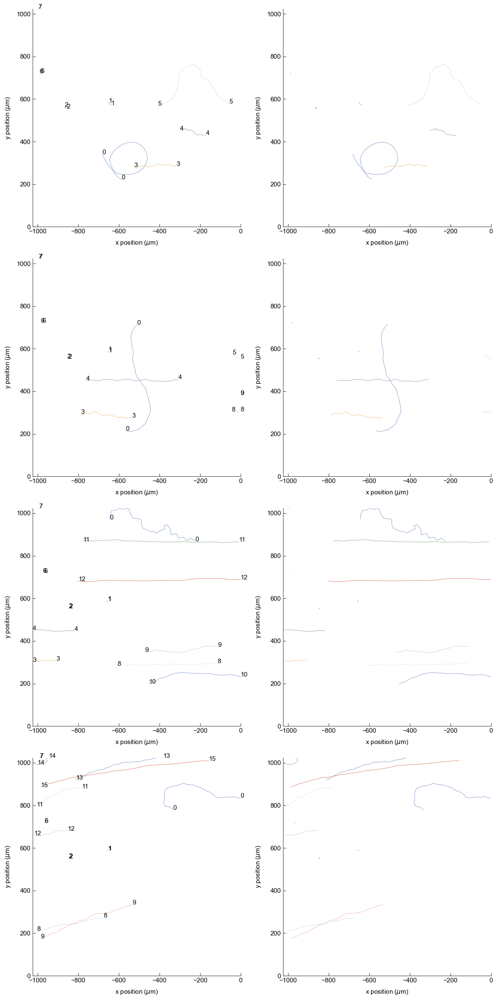

In [51]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 6]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
            
    plt.tight_layout()

# 0 V/cm : 5, 0
# 1 V/cm : 0
# 3 V/cm : 0, 10
# 5 V/cm : 0


(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(7), np.int64(5))


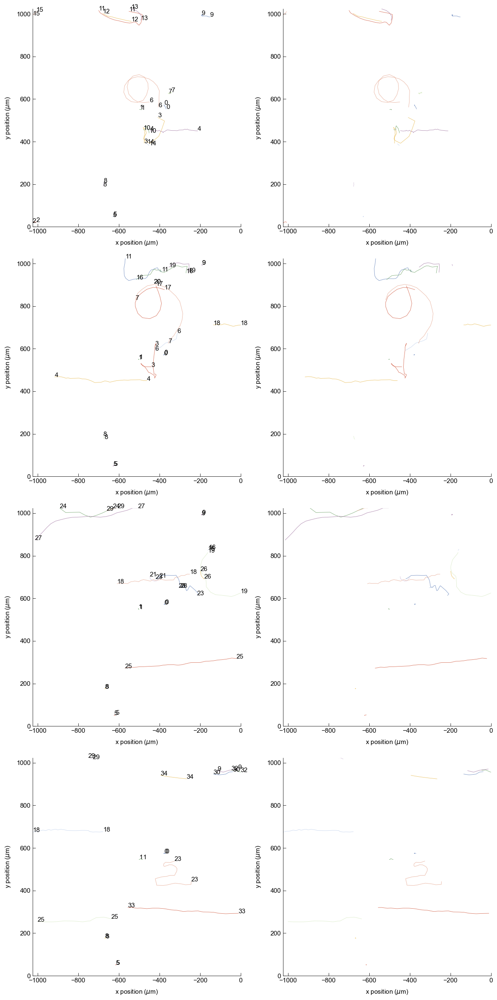

In [52]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 7]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 45:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
            
    plt.tight_layout()

# 0 V/cm : 13, 6, 3
# 1 V/cm : 3, 7, 16, 17
# 3 V/cm : 23, 19, 24, 27
# 5 V/cm : 23, 30




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(8), np.int64(5))


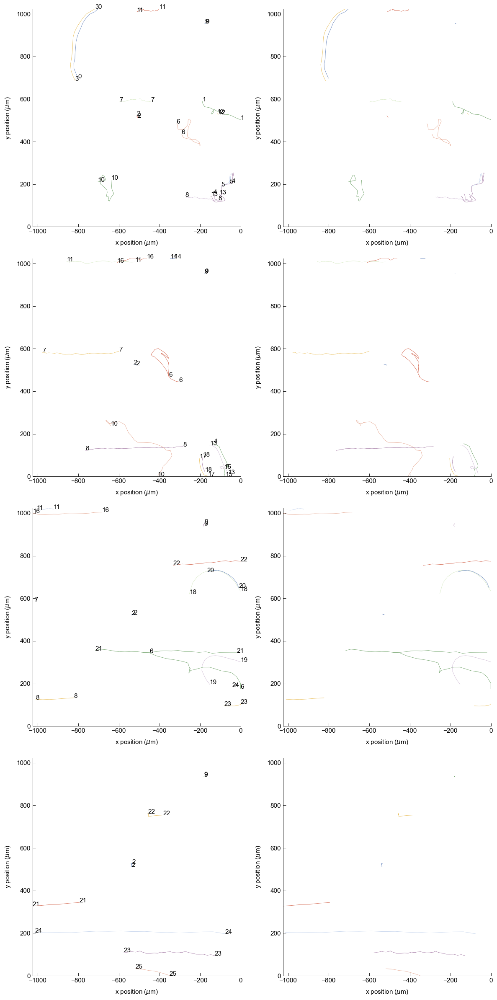

In [53]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 8]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
            
    plt.tight_layout()

# 0 V/cm : 4, 1, 6, 10, 0
# 1 V/cm : 10, 6, 13, 17
# 3 V/cm : 18, 6, 19
# 5 V/cm : 


(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(9), np.int64(5))


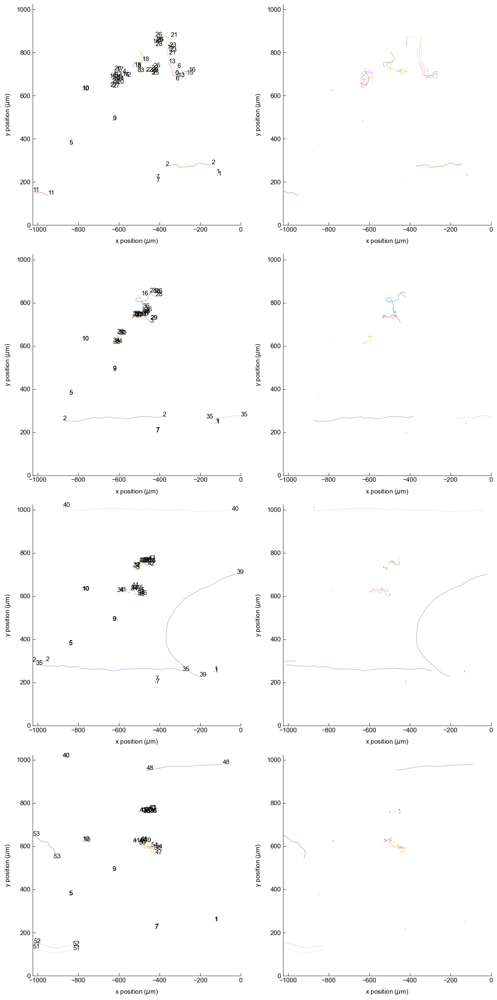

In [54]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 9]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
            
    plt.tight_layout()

# 0 V/cm : 
# 1 V/cm : 
# 3 V/cm : 39
# 5 V/cm : 


(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(10), np.int64(5))


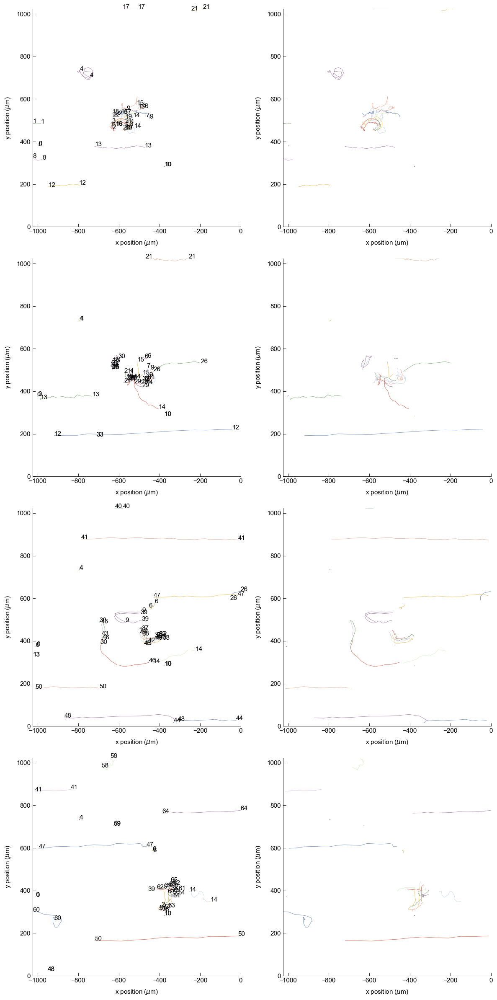

In [55]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 10]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   

    
    plt.tight_layout()

# 0 V/cm : 26, 14, 21
# 1 V/cm : 26, 14, 21
# 3 V/cm : 30, 14, 19, 39
# 5 V/cm : 14



(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(11), np.int64(5))


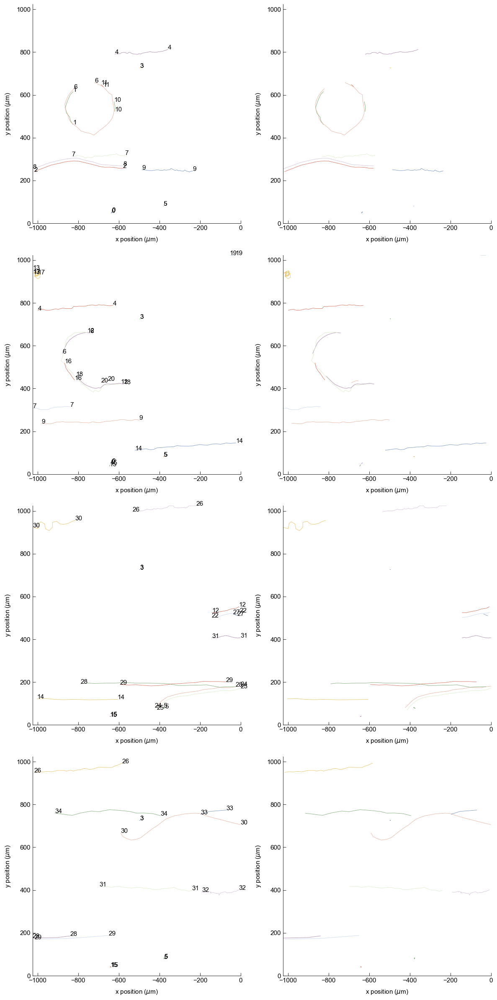

In [56]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 11]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    

            
    plt.tight_layout()

# 0 V/cm : 6, 8
# 1 V/cm : 12
# 3 V/cm : 24, 30
# 5 V/cm : 30




(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(0))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(1))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(3))
(np.int64(1), 'AP', 'zebrafish_slideB', np.int64(12), np.int64(5))


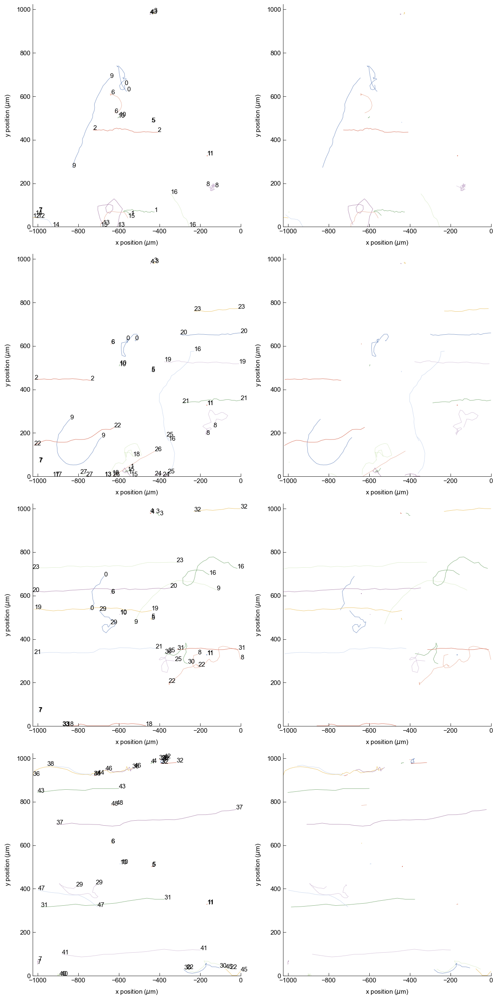

In [57]:
f, ax = plt.subplots(4, 2, figsize=(12,6*4))    
# ax = ax.ravel()
    
for sg, d in df.groupby(['trial', 'user', 'celltype', 'position', 'E_V_cm']):
    if np.all([sg[0] == 1, sg[1] == 'AP', sg[2] == 'zebrafish_slideB', sg[3] == 12]):
        print(sg)


        if sg[4] == 0:
            ind = 0
        elif sg[4] == 1:
            ind = 1
        elif sg[4] == 3:
            ind = 2
        elif sg[4] == 5:
            ind = 3
            
        aq = 0
        for g, d_ in d.groupby(['E_V_cm']):

            #if np.all([sg == 'dHL60TMEM154KO-clone1', g[0] == '5', g[1] == '20240229', g[-1] == 'HK']):
            #print(g)
            
            ##################################
            # plot tracks
            ##################################
            num_cells = len(d_.cell.unique())
            for i in d_.cell.unique():
                data_ = d_[d_.cell==i]
                #if len(data_.frame.unique()) == 31:

                # if i != 16:
                #     continue
    
                data_ = data_.replace([np.inf, -np.inf], np.nan)
                d_x = data_.x[~np.isnan(data_.x)] 
                d_y = data_.y[~np.isnan(data_.y)] 
    
                if len(d_x)==0:
                    continue

                x = data_.x.values 
                y = data_.y.values 
    
                for ax_ in [ax[ind,0], ax[ind,1]]:
                    ax_.plot(data_.x.values - 1024.0*ip, 
                                   1024.0*ip - data_.y.values)
                    ax_.set_xlabel(r'x position ($\mu$m)')
                    ax_.set_ylabel(r'y position ($\mu$m)')
                    ax_.set_xlim(-1024.0*ip, 0)
                    ax_.set_ylim(0,1024.0*ip)
                
                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]), 
                                    xytext=((data_.x.values - 1024.0*ip)[0], 
                                            (1024.0*ip - data_.y.values)[0]))

                ax[ind,0].annotate(i, xy=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]), 
                                    xytext=((data_.x.values - 1024.0*ip)[-1], 
                                            (1024.0*ip - data_.y.values)[-1]))
    
   
            
    plt.tight_layout()


# 0 V/cm : 0, 9, 13, 16, 14
# 1 V/cm : 0, 16, 9, 26, 18, 8, 16
# 3 V/cm : 0, 9, 16, 8, 29, 22
# 5 V/cm : 36, 29, 47, 22




In [68]:



###############################
# Plotting stuff
###############################

def legend_without_duplicate_labels(ax):
    handles, labels = ax.get_legend_handles_labels()
    unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
    ax.legend(*zip(*unique), bbox_to_anchor=(1.05, 1.0), loc='upper left')

###############################
# directionality calculation
# https://stackoverflow.com/questions/2827393/angles-between-two-n-dimensional-vectors-in-python
###############################
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) 

###############################
# for bootstrap analysis
###############################
# Number of replicatess
n_reps = 2000
rg = np.random.default_rng(3252)

def draw_bs_rep(data, func, rg):
    """Compute a bootstrap replicate from data."""
    bs_sample = rg.choice(data, size=len(data))
    return func(bs_sample)



In [67]:



dict_test = \
{(0, 'NB', 'zebrafish_slideB', 0) : [[23, 30, 35, 11, 27, 38, 20, 6, 3, 9, 37, 17, 1, 0, 15, 33],
                                    [1, 42, 11, 26, 23, 15, 33, 16, 0, 10, 7],
                                    [ 10, 62, 40, 6, 33, 27, 25, 1, 11, 2],
                                    [85, 62, 59, 51, 39, 13, 79, 70, 11, 92, 30, 9, 42, 86]],
(0, 'NB', 'zebrafish_slideB', 1) : [[5, 2, 6],
                                    [5, 2, 6],
                                    [2, 14, 6],
                                    [2, 22]],
(0, 'NB', 'zebrafish_slideB', 2) : [[2, 10],
                                    [10],
                                    [13],
                                    [19, 17, 15]],
(0, 'NB', 'zebrafish_slideB', 3) : [[16, 13, 1, 0, 5, 9, 14, 12, 15, 4],
                                    [4, 15, 12, 9, 14, 5, 2, 0, 1, 16],
                                    [4, 15, 9, 12, 14, 5, 19, 1, 2],
                                    [2, 4, 9, 19, 1, 24, 19, 18]],
(0, 'NB', 'zebrafish_slideB', 4) : [[1, 3, 2, 8, 0, 12, 10, 11, 13, 15],
                                    [25, 8, 0, 22, 21, 10, 3, 1],
                                    [6, 8, 4, 0, 19, 10, 3],
                                    [3, 35, 10, 41, 40, 1]],
(0, 'NB', 'zebrafish_slideB', 5) : [[7],
                                    [7],
                                    [],
                                    [16]],
(0, 'NB', 'zebrafish_slideB', 6) : [[18, 22, 26, 15, 22, 15, 10, 3, 2, 28, 7, 9, 10, 14],
                                    [18, 23, 26, 15, 22, 7, 2, 3, 41, 9 , 14, 1],
                                    [23, 26, 7, 115, 22, 51, 15, 14, 64, 58, 41, 3],
                                    [23, 75, 15, 14, 22, 93, 91, 3, 51, 58, 86, 64]],
(0, 'NB', 'zebrafish_slideB', 7) : [[6, 5, 1, 3, 4],
                                    [6, 4, 3, 5],
                                    [11, 6, 3, 5],
                                    [11, 6]],
(0, 'NB', 'zebrafish_slideB', 8) : [[10, 8, 1],
                                    [10, 8],
                                    [10, 8, 22],
                                    [10, 8]],
(0, 'NB', 'zebrafish_slideB', 9) : [[4, 3, 19, 5, 6, 18, 12, 0],
                                    [4, 0, 21, 19, 18, 6],
                                    [36, 39, 0, 18, 19, 21],
                                     [36, 39, 0, 21, 19, 18]],
(0, 'AP', 'zebrafish_slideA', 0) : [[5, 23, 12, 16, 14, 13, 31, 11],
                                    [52, 5, 53, 31, 16, 14, 59, 6, 11],
                                    [5, 6, 31, 20, 14, 11, 52, 16],
                                    [102, 119, 16, 91, 6, 5, 107]],
(0, 'AP', 'zebrafish_slideA', 1) : [[4, 30, 45, 13, 2, 26, 46, 14, 17, 18, 52, 39, 19, 11, 36, 41, 31],
                                    [71, 39, 32, 41, 11, 13, 64, 9, 30, 2,  70],
                                    [88, 32, 71, 30, 75],
                                    [108, 32, 71, 122, 30]],
(0, 'AP', 'zebrafish_slideA', 2) : [[27, 19, 9, 8, 0, 3, 13],
                                    [40, 9, 13, 19, 0, 32, 15, 8, 31],
                                    [ 40, 48, 3, 13, 15, 32, 54, 32, 19, 0],
                                    [75, 0, 32, 74, 59, 15, 19, 13, 68]],
(0, 'AP', 'zebrafish_slideA', 3) : [[17, 12, 6, 21],
                                    [ 27, 17, 16, 6],
                                    [28, 39, 19],
                                    [28, 51, 19]],
(0, 'AP', 'zebrafish_slideA', 4) : [[10, 12, 11, 18],
                                    [10, 7, 11],
                                    [10, 7, 28, 26],
                                    [10, 7, 28]],
(0, 'AP', 'zebrafish_slideA', 5) : [[6, 27, 35, 14, 24, 29, 41, 17],
                                    [14, 17, 49, 24, 46, 47, 44],
                                    [69, 17, 46, 24, 49],
                                    [87, 86]],
(0, 'AP', 'zebrafish_slideA', 6) : [[2, 9, 10, 0, 15],
                                    [21, 0, 2, 9, 19, 10],
                                    [21, 0, 9, 2, 15, 26],
                                    [0, 2, 24]],
(0, 'AP', 'zebrafish_slideA', 7) : [[0, 2, 11],
                                    [0, 20, 11],
                                    [40, 20],
                                    [40]],
(0, 'AP', 'zebrafish_slideA', 8) : [[10, 12, 3],
                                    [10, 19],
                                    [18, 10],
                                    [24, 26]],
(0, 'AP', 'zebrafish_slideA', 9) : [[13, 12, 20],
                                    [13, 25, 19],
                                    [13, 19, 34],
                                     [44, 18, 13]],
(0, 'AP', 'zebrafish_slideA', 10) : [[ 11, 17, 5],
                                    [ 11, 17, 5],
                                    [ 11, 5],
                                     [11, 5]],
(0, 'AP', 'zebrafish_slideA', 11) : [[1, 3, 6],
                                    [1, 3, 6],
                                    [1, 3, 6, 25],
                                    [28, 3]],
(1, 'NB', 'zebrafish_slideA', 0) : [[2, 0, 5, 12, 4, 8, 17, 1],
                                    [0, 2, 20, 16, 17, 8, 4, 1],
                                    [2, 16, 26, 8, 4, 25, 17, 1],
                                    [2, 25, 17]],
(1, 'NB', 'zebrafish_slideA', 1) : [[6, 15, 25, 3, 13],
                                    [13, 15, 6, 25],
                                    [56, 6, 55, 7, 40],
                                    [79, 93, 69, 84, 85, 88]],
(1, 'NB', 'zebrafish_slideA', 2) : [[1, 23, 8, 17, 12, 20, 18, 22],
                                    [12, 1],
                                    [30, 1, 42, 35, 31, 12],
                                    [57, 56, 49, 42, 53]],
(1, 'NB', 'zebrafish_slideA', 3) : [[10, 8, 14, 12, 15, 24, 9, 25, 18],
                                    [38, 8, 14, 36, 14, 32, 26, 37, 9, 18, 2],
                                    [48, 14, 54, 8, 45, 40, 26, 10, 52, 53],
                                    [8, 66, 69, 52, 73, 75, 40]],
(1, 'NB', 'zebrafish_slideA', 4) :  [[],
                                    [],
                                    [],
                                    []],
(1, 'NB', 'zebrafish_slideA', 5) : [[1, 20, 17, 13, 11, 7, 15, 22, 2, 16, 4],
                                    [29, 13, 17, 7, 11, 23, 42, 28,22],
                                    [36, 13, 48, 17, 49, 53, 7, 40, 2],
                                    [82, 28, 74, 9, 72, 48, 36, 2]],
(1, 'NB', 'zebrafish_slideA', 6) : [[],
                                    [],
                                    [],
                                    []],
(1, 'NB', 'zebrafish_slideA', 7) : [[2, 3, 4, 6, 8, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 61, 63, 66, 68, 69, 71],
                                    [3, 6, 8, 12, 13, 14, 16, 20, 24, 26, 28, 30, 31, 33, 39, 41, 42, 43, 44, 45, 46, 48, 50, 51, 52, 54, 56, 66, 68, 69, 71, 72, 79, 81, 84, 85, 86, 89, 92, 97, 98, 100, 101, 103, 105, 106, 110, 112],
                                    [3, 6, 13, 14, 24, 26, 28, 31, 33, 42, 43, 45, 48, 50, 52, 54, 56, 66, 71, 72, 81, 85, 86, 100, 101, 105, 106, 110, 118, 119, 126, 128, 130, 132, 141, 146, 152, 153, 154, 160],
                                    [3, 13, 26, 28, 31, 48, 52, 56, 66, 71, 100, 101, 105, 106, 132, 165, 166, 174, 180, 181, 184, 187, 190, 194, 196, 199, 203, 204, 206, 209, 210, 212, 214]],
(1, 'NB', 'zebrafish_slideA', 8) : [[11, 6, 10, 9, 5, 1],
                                    [25, 9, 11, 5, 10],
                                    [28, 9, 32, 10, 33, 5, 25],
                                    [32, 43, 9, 33, 28, 45]],
(1, 'NB', 'zebrafish_slideA', 9) : [[1, 11, 0, 4, 18, 6],
                                    [50, 1, 4, 18, 47, 44, 35],
                                    [69, 44, 86, 77, 66],
                                    [107, 86, 103, 51, 115, 117]],
(1, 'NB', 'zebrafish_slideA', 10) : [[10, 8, 5],
                                    [15, 17],
                                    [15, 21, 29, 17, 26],
                                    [34]],
(1, 'NB', 'zebrafish_slideA', 11) : [[],
                                    [],
                                    [],
                                    []],
(1, 'NB', 'zebrafish_slideA', 12) : [[],
                                    [],
                                    [],
                                    []],
(1, 'NB', 'zebrafish_slideA', 13) : [[7, 3, 9, 0],
                                    [14, 15, 3, 6],
                                    [6, 33, 24, 25, 27, 21, 32, 30],
                                    [54, 53, 38, 50, 45 ]],
(1, 'NB', 'zebrafish_slideA', 14) : [[12, 5, 3, 4 ],
                                    [3, 12, 5, 26, 4],
                                    [48, 40, 29, 37, 40, 41],
                                    [59, 40, 41]],
(1, 'NB', 'zebrafish_slideA', 15) : [[32, 28, 18, 3, 0, 12, 24, 14, 10, 56, 15, 17, 23, 39],
                                    [3, 18, 9, 0, 62, 38, 10, 24, 14, 36, 17, 56, 39, 57, 47],
                                    [61, 85, 70, 14, 10, 73, 15, 77, 9, 18, 82],
                                    [126, 102, 18, 70, 109, 127]],
(1, 'NB', 'zebrafish_slideA', 16) : [[11, 9, 8, 19, 6, 21, 5, 20],
                                    [11, 9, 21, 5, 20, 8],
                                    [53, 50, 8, 5, 20, 21, 9],
                                    [20, 71, 75, 21, 5, 70, 65]],
(1, 'NB', 'zebrafish_slideA', 17) : [[9, 2, 22, 26, 18, 6, 4, 10],
                                    [43, 41, 2, 4, 6, 36, 40, 30, 10],
                                    [30, 58, 10, 47, 61, 5],
                                    [61, 59, 10, 68, 75]],
(1, 'NB', 'zebrafish_slideA', 18) : [[15, 13, 7, 4, 8, 10],
                                    [20, 17, 13, 16, 8],
                                    [31, 27, 24, 13, 20],
                                    [34, 27, 37]],
(1, 'AP', 'zebrafish_slideB', 0) : [[14, 10, 9],
                                    [9, 14],
                                    [9, 6, 31],
                                    [6, 31]],
(1, 'AP', 'zebrafish_slideB', 1) : [[10, 5, 4, 3],
                                    [5, 21, 3, 11, 10],
                                    [3, 11, 22, 10],
                                    [41, 11, 45, 42, 51]],
(1, 'AP', 'zebrafish_slideB', 2) : [[6, 9, 8],
                                    [8, 9, 6, 19],
                                    [9],
                                    []],
(1, 'AP', 'zebrafish_slideB', 3) : [[9, 6],
                                    [18, 6],
                                    [],
                                    []],
(1, 'AP', 'zebrafish_slideB', 4) : [[29, 11, 31, 3, 14, 18, 2, 1],
                                    [27, 3, 14, 11, 40],
                                    [11, 14, 52, 3, 18, 2, 31],
                                    [8, 31, 27, 3, 18, 87, 52, 21, 91]],
(1, 'AP', 'zebrafish_slideB', 5) : [[3, 8, 6, 9],
                                    [3, 8, 9],
                                    [3, 12],
                                    [3]],
(1, 'AP', 'zebrafish_slideB', 6) : [[5, 0],
                                    [0],
                                    [0, 10],
                                    [0]],
(1, 'AP', 'zebrafish_slideB', 7) : [[13, 6, 3],
                                    [3, 7, 16, 17],
                                    [23, 19, 24, 27],
                                    [23, 30]],
(1, 'AP', 'zebrafish_slideB', 8) : [[4, 1, 6, 10, 0],
                                    [10, 6, 13, 17],
                                    [18, 6, 19],
                                    []],
(1, 'AP', 'zebrafish_slideB', 9) : [[],
                                    [],
                                    [39],
                                    []],
(1, 'AP', 'zebrafish_slideB', 10) : [[26, 14, 21],
                                    [26, 14, 21],
                                    [30, 14, 19, 39],
                                    [14]],
(1, 'AP', 'zebrafish_slideB', 11) : [[6, 8],
                                    [12],
                                    [24, 30],
                                     [30]],
(1, 'AP', 'zebrafish_slideB', 12) : [[0, 9, 13, 16, 14],
                                    [0, 16, 9, 26, 18, 8, 16],
                                    [0, 9, 16, 8, 29, 22],
                                    [36, 29, 47, 22]]}




color_dict = dict(zip(df.celltype.unique(), 
                     sns.color_palette("Set2", len(df.celltype.unique())).as_hex())) 



(0, 'NB', 'zebrafish_slideB', 0)
(0, 'NB', 'zebrafish_slideB', 1)
(0, 'NB', 'zebrafish_slideB', 2)
(0, 'NB', 'zebrafish_slideB', 3)
(0, 'NB', 'zebrafish_slideB', 4)
(0, 'NB', 'zebrafish_slideB', 5)
(0, 'NB', 'zebrafish_slideB', 6)
(0, 'NB', 'zebrafish_slideB', 7)
(0, 'NB', 'zebrafish_slideB', 8)
(0, 'NB', 'zebrafish_slideB', 9)
(0, 'AP', 'zebrafish_slideA', 0)
(0, 'AP', 'zebrafish_slideA', 1)
(0, 'AP', 'zebrafish_slideA', 2)
(0, 'AP', 'zebrafish_slideA', 3)
(0, 'AP', 'zebrafish_slideA', 4)
(0, 'AP', 'zebrafish_slideA', 5)
(0, 'AP', 'zebrafish_slideA', 6)
(0, 'AP', 'zebrafish_slideA', 7)
(0, 'AP', 'zebrafish_slideA', 8)
(0, 'AP', 'zebrafish_slideA', 9)
(0, 'AP', 'zebrafish_slideA', 10)
(0, 'AP', 'zebrafish_slideA', 11)
(1, 'NB', 'zebrafish_slideA', 0)
(1, 'NB', 'zebrafish_slideA', 1)
(1, 'NB', 'zebrafish_slideA', 2)
(1, 'NB', 'zebrafish_slideA', 3)
(1, 'NB', 'zebrafish_slideA', 4)
(1, 'NB', 'zebrafish_slideA', 5)
(1, 'NB', 'zebrafish_slideA', 6)
(1, 'NB', 'zebrafish_slideA', 7)
(1, 'NB'

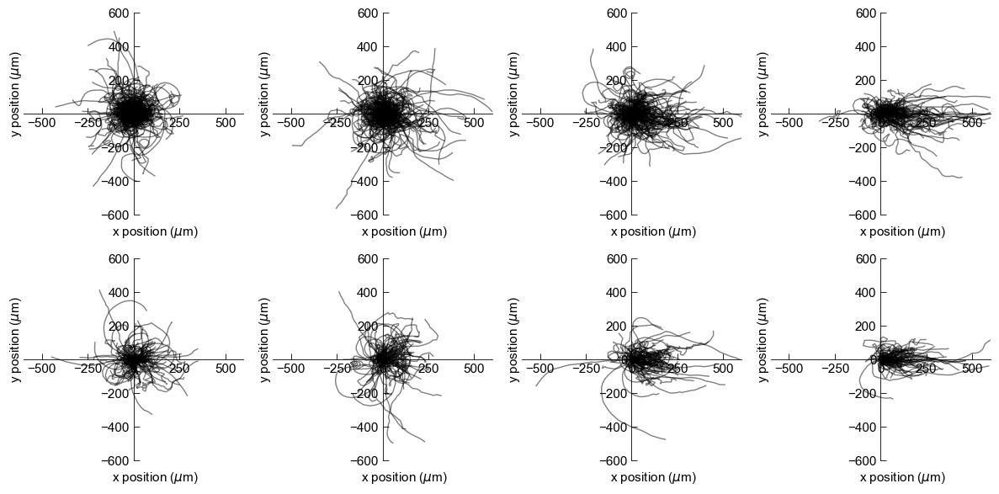

In [73]:
for f in dict_test:
    print(f)

EF_dict = {0 : 0,
           1 : 1, 
           3 : 2, 
           5 : 3}

dict_ax = {'zebrafish_slideA' : 0, 'zebrafish_slideB' : 1}

df_filtered = pd.DataFrame()
    
f, ax = plt.subplots(2, 4, figsize=(12,6))
# ax = ax.ravel()

count = 0
for g, d in df.groupby(['celltype', 'E_V_cm']):
    print(g)
    ###################################################
    ########## figure of relative trajectories ########
    ###################################################
    count_cell = 0
    for i, d_ in d.groupby(['cell',  'trial', 'date', 'user', 'position']):
        #print((i[1],i[3], g[0], i[4]))
        cells_ =dict_test[(i[1],i[3], g[0], i[4])][EF_dict[g[1]]]
        if i[0] not in cells_:
            continue
        
        #if len(d_) <= 5:
        #    continue

        t0_x = d_[d_.frame == d_.frame.min()].x.values
        t0_y = d_[d_.frame == d_.frame.min()].y.values

        if np.shape(t0_x)== (0,):
            continue
        if len(d_.x.values) != len(d_.y.values):
            continue

        ax[dict_ax[g[0]], EF_dict[g[1]]].plot(d_.x - t0_x, 
                       d_.y - t0_y, color = 'k', alpha = 0.5, lw = 1, zorder = 20)
        ax[dict_ax[g[0]], EF_dict[g[1]]].set_xlabel(r'x position ($\mu$m)')
        ax[dict_ax[g[0]], EF_dict[g[1]]].set_ylabel(r'y position ($\mu$m)')

        count_cell += 1
        if d_.celltype.unique() == 'zebrafish_slideA':
            d_['celltype_genotype'] = 'Galvanin_KO'
        elif d_.celltype.unique() == 'zebrafish_slideB':
            d_['celltype_genotype'] = 'Galvanin_WT'
            
        df_filtered = pd.concat([df_filtered, d_], ignore_index = True)
        
    print(g, count_cell)
        

    #count += 1

        
    for ax_ in ax.ravel():
        ax_.spines['left'].set_position(('data', 0))
        ax_.spines['bottom'].set_position(('data', 0))
        ax_.xaxis.set_label_coords(0.6, -0.05)
        ax_.yaxis.set_label_coords(0.0, 0.6)

        ax_.set_xlim(-600,600)
        ax_.set_ylim(-600,600)
        ax_.set_axisbelow(True)


    plt.tight_layout()
    #plt.savefig('20250315_keratocytes_Last-20min_rel_trajectories.pdf')

    # plt.close()





In [75]:
df_filtered.to_csv('../../data/processed_tracking/20250420_isolated_zebrafish_keratocytes_tracking_filtered.csv')

('zebrafish_slideA',)
[-0.01785184]
[-0.01785184  0.20024935]
[-0.01785184  0.20024935  0.39323247]
[-0.01785184  0.20024935  0.39323247  0.57051633]
[0.0, 1.0, 3.0, 5.0] [-0.01785184  0.20024935  0.39323247  0.57051633]
('zebrafish_slideB',)
[0.13930334]
[0.13930334 0.45200677]
[0.13930334 0.45200677 0.76607364]
[0.13930334 0.45200677 0.76607364 0.90639436]
[0.0, 1.0, 3.0, 5.0] [0.13930334 0.45200677 0.76607364 0.90639436]


Text(0.5, 0, 'electric field strength (mV/mm)')

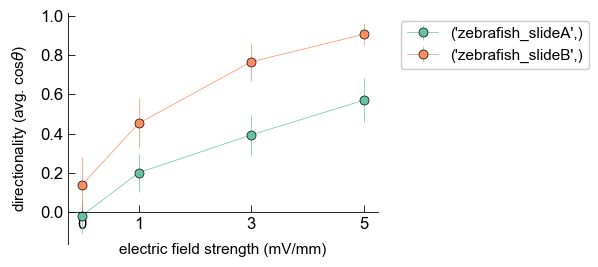

In [70]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            #if cell[1] == 0:
            #    continue
            if cell[0] not in cells_:
                continue
            #if len(d_.frame.unique())>=10:
            dx2 = d_[d_.frame==d_.frame.max()].x.values[0] - d_[d_.frame==d_.frame.min()].x.values[0]
            dy2 = d_[d_.frame==d_.frame.max()].y.values[0] - d_[d_.frame==d_.frame.min()].y.values[0]

            rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')

# plt.savefig('20250315_keratocytes_Last-20min_directionality_lastVSfirst.pdf')





('zebrafish_slideA',)
[-0.07428941]
[-0.07428941  0.50893559]
[-0.07428941  0.50893559  0.82682071]
[-0.07428941  0.50893559  0.82682071  0.92676369]
[0.0, 1.0, 3.0, 5.0] [-0.07428941  0.50893559  0.82682071  0.92676369]
('zebrafish_slideB',)
[-0.02805553]
[-0.02805553  0.20837419]
[-0.02805553  0.20837419  0.45322402]
[-0.02805553  0.20837419  0.45322402  0.55321354]
[0.0, 1.0, 3.0, 5.0] [-0.02805553  0.20837419  0.45322402  0.55321354]


Text(0.5, 0, 'electric field strength (mV/mm)')

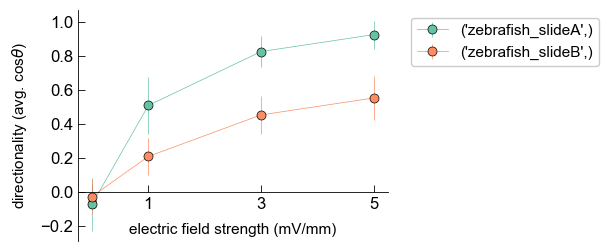

In [50]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            #if cell[1] == 0:
            #    continue
            if cell[0] not in cells_:
                continue
            #if len(d_.frame.unique())>=10:
            dx2 = d_[d_.frame==d_.frame.max()].x.values[0] - d_[d_.frame==d_.frame.min()].x.values[0]
            dy2 = d_[d_.frame==d_.frame.max()].y.values[0] - d_[d_.frame==d_.frame.min()].y.values[0]

            rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')

# plt.savefig('20250315_keratocytes_Last-20min_directionality_lastVSfirst.pdf')





('zebrafish_slideA',)
[-0.05666842]
[-0.05666842  0.27621836]
[-0.05666842  0.27621836  0.44085354]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[-0.05666842  0.27621836  0.44085354  0.63203307]
[0.0, 1.0, 3.0, 5.0] [-0.05666842  0.27621836  0.44085354  0.63203307]
('zebrafish_slideB',)


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.08064557]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.08064557 0.26608163]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.08064557 0.26608163 0.56887433]
[0.08064557 0.26608163 0.56887433 0.74599136]
[0.0, 1.0, 3.0, 5.0] [0.08064557 0.26608163 0.56887433 0.74599136]


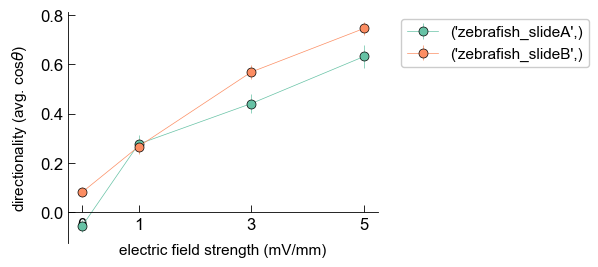

In [219]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            #if cell[1] == 1:
            #    continue
            if cell[0] not in cells_:
                continue

            
            d_ = d_.replace([np.inf, -np.inf], np.nan)
            d_ = d_.dropna()
            if len(d_.frame.unique()) != len(np.arange(d_.frame.min(), d_.frame.max()+1)):
                continue

            for frame in d_.frame.unique()[:-2]:
                #print(d_[d_.frame==frame + 1].x.values)
                dx2 = d_[d_.frame==frame + 1].x.values[0] - d_[d_.frame==frame].x.values[0]
                dy2 = d_[d_.frame==frame + 1].y.values[0] - d_[d_.frame==frame].y.values[0]
    
                rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')


# plt.savefig('20250315_keratocytes_Last-20min_directionality_allsteps.pdf')


('zebrafish_slideA',)
[-0.09009513]
[-0.09009513  0.28861928]
[-0.09009513  0.28861928  0.44797216]
[-0.09009513  0.28861928  0.44797216  0.65828001]
[0.0, 1.0, 3.0, 5.0] [-0.09009513  0.28861928  0.44797216  0.65828001]
('zebrafish_slideB',)
[0.06990512]
[0.06990512 0.32205709]


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)


[0.06990512 0.32205709 0.5864994 ]
[0.06990512 0.32205709 0.5864994  0.74973964]
[0.0, 1.0, 3.0, 5.0] [0.06990512 0.32205709 0.5864994  0.74973964]


Text(0.5, 0, 'electric field strength (mV/mm)')

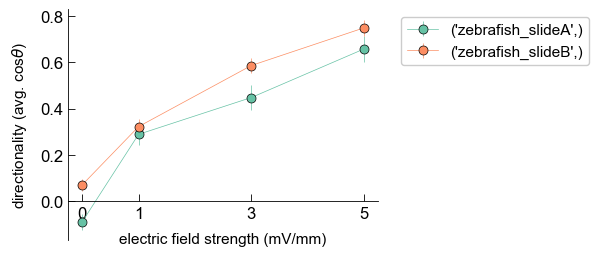

In [209]:
fig, ax = plt.subplots(1,1,figsize = (4,3))

for g, _d in df.groupby(['celltype']):
    print(g)

    E_val = []
    rad_cos_mean = []
    rad_cos_err = []

    for E, d in _d.groupby('E_V_cm'):
        rad = []
        dx = []
        dy = []
        d = d.replace([np.inf, -np.inf], np.nan)
        d = d.dropna()

        for cell, d_ in d.groupby(['cell', 'trial', 'user', 'position', 'date']):
            cells_ = dict_test[(cell[1], cell[2], g[0], cell[3])][EF_dict[E]]
            if cell[1] == 0:
                continue
            if cell[0] not in cells_:
                continue

            
            d_ = d_.replace([np.inf, -np.inf], np.nan)
            d_ = d_.dropna()
            if len(d_.frame.unique()) != len(np.arange(d_.frame.min(), d_.frame.max()+1)):
                continue

            for frame in d_.frame.unique()[:-3]:
                #print(d_[d_.frame==frame + 1].x.values)
                dx2 = d_[d_.frame==frame + 2].x.values[0] - d_[d_.frame==frame].x.values[0]
                dy2 = d_[d_.frame==frame + 2].y.values[0] - d_[d_.frame==frame].y.values[0]
    
                rad = np.append(rad, angle_between([dx2, dy2], [1, 0]))
        
        
        rad_cos = np.cos(rad)
        rad_cos = rad_cos[~np.isnan(rad_cos)]
        #print(rad_cos)

        # Compute replicates
        bs_reps = np.array(
            [draw_bs_rep(rad_cos, np.mean, rg) for _ in range(n_reps)]
            )

        # Compute the confidence interval
        conf_int = np.percentile(bs_reps, [2.5, 97.5])
        
        E_val = np.append(E_val, E)
        rad_cos_mean = np.append(rad_cos_mean, np.mean(rad_cos))
        rad_cos_err = np.append(rad_cos_err, np.array(np.mean(rad_cos) - conf_int[0], conf_int[1] - np.mean(rad_cos)))
        print(rad_cos_mean)
    gene = g
#     ax.errorbar
    print([float(e) for e in E_val], rad_cos_mean)
    ax.errorbar([float(e) for e in E_val], rad_cos_mean, 
                yerr = rad_cos_err,
               color = color_dict[g[0]], marker ='o', markersize= 6.5, linewidth = 0.5,
                linestyle = '-', label = g, markeredgecolor = 'k',
               markeredgewidth = 0.5)


legend_without_duplicate_labels(ax)
ax.spines['bottom'].set_position(('data', 0))
# ax.set_ylim(-0.1, 1)
# ax.set_yticks([0,0.5,1.0])
# ax.set_xticks([0,1, 2, 3, 4, 5])
ax.set_xticks([0,1, 3, 5])

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylabel(r'directionality (avg. cos$\theta$)')
ax.set_xlabel('electric field strength (mV/mm)')








## compasss autocorrelation

In [202]:
###############################
# Autocorrelation calculation
###############################

def non_overlapping_normalized_autocorrelation(signal):
    """
    Calculate the non-overlapping normalized autocorrelation of a 1D signal.
    
    Parameters:
    signal (np.ndarray): Input 1D signal.
    
    Returns:
    np.ndarray: Non-overlapping normalized autocorrelation values.
    """
    n = len(signal)
    autocorrelation = np.zeros(n)
    
    for lag in range(n):
        sum_product = 0
        count = 0
        for i in range(0, n - lag, lag + 1):
            sum_product += signal[i] * signal[i + lag]
            count += 1
        
        if count > 0:
            # Normalizing with respect to the sum of squares for lag 0
            normalization_factor = np.sqrt(np.sum(signal[:n - lag:lag + 1] ** 2) * np.sum(signal[lag:n:lag + 1] ** 2))
            autocorrelation[lag] = sum_product / normalization_factor if normalization_factor != 0 else 0
    
    return autocorrelation
    
    
    
# df_angle_E_3 = pd.DataFrame()

# for g, d_ in df.groupby(['celltype', 'E_V_cm', 'date', 'trial', 'user', 'position', 'cell']):
#     d_.frame = d_.frame - d_.frame.min()
    
#     if len(np.arange(d_.frame.min(), d_.frame.max())) + 1 != len(d_.frame.unique()):
#         continue
#     else:
#         # Iterate over frames with a step size of 3
#         for t in np.arange(d_.frame.min() + 3, d_.frame.max() + 1, 3):
#             if (t - 3) < d_.frame.min():  # Ensure there's enough data for the intervals
#                 continue
            
#             vec_t1 = [d_[d_.frame == t-3].x.values[0] - d_[d_.frame == t].x.values[0],
#                       d_[d_.frame == t-3].y.values[0] - d_[d_.frame == t].y.values[0]]
#             vec_t2 = [3, 0]  # reference vector (magnitude not important)

#             datalist = {'celltype': g[0],
#                         'E_V_cm': g[1],
#                         'date': g[2],
#                         'trial': g[3],
#                         'user': g[4],
#                         'cell': g[6],
#                         'interval': t,
#                         'position': g[5], 
#                         'angle': angle_between(vec_t2, vec_t1),
#                         'cos_angle': np.cos(angle_between(vec_t2, vec_t1))}
#             df_dict = pd.DataFrame([datalist])
#             df_angle_E_3 = pd.concat([df_angle_E_3, df_dict], ignore_index=True)

df_angle_E_2 = pd.DataFrame()

for g, d_ in df.groupby(['celltype', 'E_V_cm', 'date', 'trial', 'user', 'position', 'cell']):
    d_.frame = d_.frame - d_.frame.min()
    if len(d_.frame.unique()) <=10:
        continue
    if len(np.arange(d_.frame.min(), d_.frame.max())) + 1 != len(d_.frame.unique()):
        continue
    else:
        # Iterate over frames with a step size of 2
        for t in np.arange(d_.frame.min() + 2, d_.frame.max() + 1, 2):
            if (t - 2) < d_.frame.min():  # Ensure there's enough data for the intervals
                continue
            
            vec_t1 = [d_[d_.frame == t-2].x.values[0] - d_[d_.frame == t].x.values[0],
                      d_[d_.frame == t-2].y.values[0] - d_[d_.frame == t].y.values[0]]
            vec_t2 = [2, 0]  # reference vector (magnitude not important)

            datalist = {'celltype': g[0],
                        'E_V_cm': g[1],
                        'date': g[2],
                        'trial': g[3],
                        'user': g[4],
                        'cell': g[6],
                        'interval': t,
                        'position': g[5], 
                        'angle': angle_between(vec_t2, vec_t1),
                        'cos_angle': np.cos(angle_between(vec_t2, vec_t1))}
            df_dict = pd.DataFrame([datalist])
            df_angle_E_2 = pd.concat([df_angle_E_2, df_dict], ignore_index=True)


/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encountered in divide
  return vector / np.linalg.norm(vector)
/var/folders/hs/8f67z23n6g9g9g4y03yhrn_c0000gn/T/ipykernel_32832/2038947858.py:16: RuntimeWarning: invalid value encount

In [203]:
df_angle_E_2.interval.unique()
# df_angle_E_3.celltype.unique()

array([ 2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28])

('zebrafish_slideA', np.int64(0))
(197,)
[1.         0.35848309 0.24672943 0.07614213 0.0964467  0.03553299]
('zebrafish_slideA', np.int64(1))
(177,)
[1.         0.36176448 0.27253547 0.24293785 0.15254237 0.11864407]
('zebrafish_slideA', np.int64(3))
(152,)
[1.         0.39067454 0.32638114 0.36842105 0.28947368 0.26315789]
('zebrafish_slideA', np.int64(5))
(125,)
[1.         0.36452297 0.36208402 0.376      0.296      0.28      ]
('zebrafish_slideB', np.int64(0))
(272,)
[1.         0.47915344 0.27414819 0.17647059 0.13970588 0.125     ]
('zebrafish_slideB', np.int64(1))
(209,)
[1.         0.44124279 0.31954391 0.23444976 0.18660287 0.17703349]
('zebrafish_slideB', np.int64(3))
(199,)
[1.         0.45948866 0.33858832 0.26633166 0.35678392 0.30653266]
('zebrafish_slideB', np.int64(5))
(166,)
[1.         0.45043923 0.48028286 0.44578313 0.43373494 0.3373494 ]


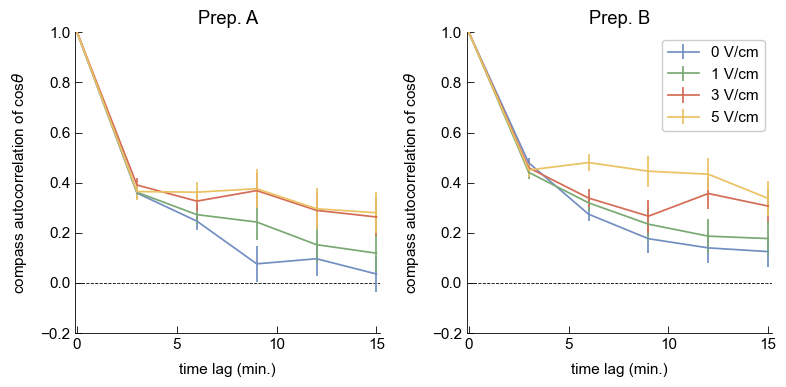

In [204]:
dict_ax = {'zebrafish_slideA': 0, 'zebrafish_slideB': 1}

f, ax = plt.subplots(1,2, figsize = (8,4))

for g, d in df_angle_E_2.groupby(['celltype', 'E_V_cm']):    
    acf_all = np.zeros(6)
    
    for g_, d_ in d.groupby(['date', 'trial', 'user', 'position', 'cell']):
        d_ = d_.sort_values('interval')
        y = d_.cos_angle.values
        #print(len(y))   
        #if np.all([g[1] == '0', g_[1] == '0']):
        #    continue

        # need each array to be same length (take only full length 
        # tracks, or ones missing an interval)
        if len(y) > 5:
            y = y[:6]
        if len(y) != 6:
            continue
        #print(y)
        # if np.any(np.isnan(y)):
        #     continue
            
        #print(y)
        acf = non_overlapping_normalized_autocorrelation(y)  
        if np.any(np.isnan(acf)):
            continue
        acf_all = np.vstack([acf_all, acf])

    acf_all = acf_all[1:,:]
    print(g)
    print(np.mean(acf_all, axis =1).shape)
    print(np.mean(acf_all[:,:6], axis =0))
    ax[dict_ax[g[0]]].errorbar(x = np.arange(6)*3,
                   y = np.mean(acf_all[:,:6], axis =0), 
                   yerr = np.var(acf_all[:,:6], axis =0)/np.sqrt(len(acf_all[:,:6])),
                   label = ''.join([str(g[1]),' V/cm']), zorder = 10, lw = 1.25)
    
# ax.legend()

for ax_ in ax:
    ax_.set_xlim(-0.1, 5*3+0.2)
    ax_.set_ylim(-0.2, 1)
    ax_.hlines(0,0,6*3, zorder = 0, color = 'k', linestyle = '--')
    ax_.set_xlabel('time lag (min.)')
    
    ax_.set_ylabel('compass autocorrelation '
                 r'of cos$\theta$')

# plt.savefig('../../figures/Figure3_supp_autocorr.pdf')

ax[0].set_title('Prep. A')
ax[1].set_title('Prep. B')

plt.tight_layout()
# f.savefig('20241213_truncation_compass.pdf', bbox_inches='tight')
ax[1].legend()


{'zebrafish_TMEM154-KO': 1, 'zebrafish_WT': 0}